In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from collections import OrderedDict
import glob
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import matplotlib
import matplotlib.font_manager as font_manager
from matplotlib.lines import Line2D
from matplotlib import gridspec
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)

def convert_nan_to_val(data, value=0):
    data[pd.isnull(data)] = value
    return data

In [2]:
not_combined_pickle_file = './paper_models_csvs_pkls/data_models-sig_rem_False_rem_add_False_stat_sig_False_top_sig_False_0_30avg_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo_withfeatstd.pkl'
combined_pickle_file = './paper_models_csvs_pkls/combined_data_models-sig_rem_False_stat_sig_False_top_sig_False_0_30avg_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo.pkl'
not_combined_ds = pickle.load(open(not_combined_pickle_file, 'rb'))
combined_ds = pickle.load(open(combined_pickle_file, 'rb'))

not_combined_pickle_file_stat_sig = './paper_models_csvs_pkls/data_models-sig_rem_False_stat_sig_True_top_sig_False_0_30avg_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo.pkl'
combined_pickle_file_stat_sig = './paper_models_csvs_pkls/combined_data_models-sig_rem_False_stat_sig_True_top_sig_False_0_30avg_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo.pkl'
not_combined_ds_stat_sig = pickle.load(open(not_combined_pickle_file_stat_sig, 'rb'))
combined_ds_stat_sig = pickle.load(open(combined_pickle_file_stat_sig, 'rb'))

not_combined_pickle_file_no_stat_sig = './paper_models_csvs_pkls/data_models-sig_rem_True_stat_sig_False_top_sig_False_0_30avg_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo.pkl'
combined_pickle_file_no_stat_sig = './paper_models_csvs_pkls/combined_data_models-sig_rem_True_stat_sig_False_top_sig_False_0_30avg_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo.pkl'

not_combined_ds_no_stat_sig = pickle.load(open(not_combined_pickle_file_no_stat_sig, 'rb'))
combined_ds_no_stat_sig = pickle.load(open(combined_pickle_file_no_stat_sig, 'rb'))

meta_data = pd.read_csv('./ms_instrument_column_polarity_dataset_names.csv')

In [3]:
non_combined_to_keep = ['IPO_aligned_ST000763_untar_neg_Healthy_PAH', 'IPO_aligned_ST000763_untar_neg_Normal Pressures_LowRisk',
                        'IPO_aligned_ST000763_untar_neg_Borderline Pressures_LowRisk', 'IPO_aligned_ST000763_untar_neg_PAH_Normal Pressures',
                        'IPO_aligned_ST000763_untar_neg_Healthy_LowRisk', 'IPO_aligned_ST000763_untar_neg_Healthy_Borderline Pressures',
                        'IPO_aligned_ST000763_untar_neg_Normal Pressures_Borderline Pressures', 'IPO_aligned_MTBLS408_pos',
                        'IPO_aligned_ST000763_untar_neg_Healthy_Normal Pressures', 'IPO_aligned_ST000763_untar_pos_Normal Pressures_LowRisk',
                        'IPO_aligned_ST000763_untar_neg_PAH_Borderline Pressures', 'IPO_aligned_ST000763_untar_pos_Normal Pressures_Borderline Pressures',
                        'IPO_aligned_ST000763_untar_pos_PAH_LowRisk', 'IPO_aligned_ST000763_untar_pos_PAH_Borderline Pressures',
                        'IPO_aligned_ST000763_untar_pos_Borderline Pressures_LowRisk', 'IPO_aligned_MTBLS408_neg', 
                        'IPO_aligned_ST000763_untar_pos_PAH_Normal Pressures', 'IPO_aligned_ST000763_untar_neg_PAH_LowRisk', 
                        'IPO_aligned_ST000763_untar_pos_Healthy_Borderline Pressures', 'IPO_aligned_ST000763_untar_pos_Healthy_Normal Pressures',
                        'IPO_aligned_ST000763_untar_pos_Healthy_PAH', 'IPO_aligned_ST000763_untar_pos_Healthy_LowRisk', 'IPO_aligned_MTBLS28_pos', 
                        'IPO_aligned_ST000385_onebatch_plasma', 'AN000582', 'AN000583', 'AN000580', 'AN000452_Healthy_Polyp',
                        'AN000452_CRC_Polyp', 'IPO_aligned_ST000385_onebatch_serum', 'AN000452_Healthy_CRC', 'IPO_aligned_MTBLS92',
                        'AN000581', 'IPO_aligned_ST000388_LC', 'IPO_aligned_ST000392_serum', 'IPO_aligned_ST000392_plasma',
                        'IPO_aligned_MTBLS28_neg', 'IPO_aligned_ST000396', 'IPO_aligned_ST000865_onebatch', 
                        'IPO_aligned_MTBLS105_SIM-MS', 'IPO_aligned_MTBLS105_qMS', 'IPO_aligned_MTBLS17_neg_onebatch', 
                        'IPO_aligned_MTBLS17_pos_onebatch', 'IPO_aligned_MTBLS19_pos_all_F_R', 'IPO_aligned_MTBLS19_neg_all_F_R', 
                        'IPO_aligned_ST000388_GC', 'AN001503', 'serum_onebatch_IPO_align_Feng_serum_all', 
                        'urine_onebatch_IPO_aligned_Feng_urine_all', 'ulsam_IPO_reprocessedfirst',
                        'IPO_aligned_ST000329_neg_FSGS_Control', 'IPO_aligned_ST000329_pos_MCD_Control',
                        'IPO_aligned_ST000329_neg_MCD_FSGS', 'IPO_aligned_ST000329_neg_MCD_Control', 
                        'IPO_aligned_ST000329_pos_MCD_FSGS', 'IPO_aligned_ST000329_pos_FSGS_Control', 'AN001450',
                        'IPO_aligned_MTBLS315_p_mzML', 'IPO_aligned_MTBLS315_mzData', 'IPO_aligned_MTBLS315_n_mzML', 
                        'IPO_aligned_MTBLS315_mzXML', 'm_chronic_hep_b_NEG', 'm_oxylipin_chronic_hep_b', 'IPO_aligned_MTBLS354_pos', 
                        'IPO_aligned_ST000578_AE', 'm_typhoid_carriage_metabolite_profiling_mass_spectrometry_v2_maf', 
                        'IPO_aligned_ST000578_C18', 'm_chronic_hep_b_POS', 'IPO_aligned_MTBLS354_neg', 'IPO_aligned_MTBLS352_neg_T2D_Pre-DM',
                        'AN000618', 'IPO_aligned_MTBLS352_neg_T2D_NGT', 'IPO_aligned_ST000045_2feb_pos_ND_IW', 
                        'IPO_aligned_ST000045_2feb_pos_ND_II', 'IPO_aligned_ST000045_2feb_pos_II_IW', 'IPO_aligned_ST000045_11feb_neg_ND_IW',
                        'IPO_aligned_ST000045_11feb_neg_II_IW', 'IPO_aligned_ST000045_11mar_pos_ND_II', 'IPO_aligned_ST000045_11mar_pos_ND_IW',
                        'IPO_aligned_ST000045_11mar_pos_II_IW', 'IPO_aligned_ST000045_17mar_neg_ND_II', 'IPO_aligned_ST000045_17mar_neg_ND_IW',
                        'IPO_aligned_ST000045_17mar_neg_II_IW', 'AN000929', 'AN000931', 'AN000930', 'IPO_aligned_MTBLS352_neg_NGT_Pre-DM', 
                        'IPO_aligned_ST000045_11feb_neg_ND_II', 'XCMS-Report-annotated-SingleClass-GCTOF.plasma', 
                        'IPO_aligned_ST000046_20120618_pos_c18_MCI_AD', 'XCMS-Report-annotated-SingleClass.04jun12_CN_AD', 
                        'XCMS-Report-annotated-SingleClass-GCTOF.', 'XCMS-Report-annotated-SingleClass.27jun12_MCI_AD', 
                        'XCMS-Report-annotated-SingleClass.27jun12_CN_AD', 'XCMS-Report-annotated-SingleClass.11jun12_CN_MCI', 
                        'IPO_aligned_MTBLS72_pos', 'IPO_aligned_ST000046_20120620_neg_c18_MCI_AD', 
                        'IPO_aligned_ST000046_20120620_neg_c18_CN_AD', 'IPO_aligned_ST000046_20120620_neg_c18_CN_MCI', 
                        'IPO_aligned_ST000046_20120618_pos_c18_CN_AD', 'IPO_aligned_ST000046_20120618_pos_c18_CN_MCI', 
                        'IPO_aligned_ST000046_20120613_neg_hilic_MCI_AD', 'XCMS-Report-annotated-SingleClass.04jun12_MCI_AD', 
                        'IPO_aligned_ST000046_20120613_neg_hilic_CN_AD', 'IPO_aligned_ST000046_20120613_neg_hilic_CN_MCI', 
                        'IPO_aligned_ST000046_20120606_neg_hilic_MCI_AD', 'IPO_aligned_ST000046_20120606_neg_hilic_CN_AD', 
                        'IPO_aligned_ST000046_20120606_neg_hilic_CN_MCI', 'IPO_aligned_ST000046_20120625_pos_c18_CN_MCI', 
                        'IPO_aligned_ST000046_20120625_pos_c18_CN_AD', 'IPO_aligned_ST000046_20120625_pos_c18_MCI_AD', 
                        'XCMS-Report-annotated-SingleClass.04jun12_CN_MCI', 'XCMS-Report-annotated-SingleClass.27jun12_CN_MCI', 
                        'XCMS-Report-annotated-SingleClass.11jun12_MCI_AD', 'XCMS-Report-annotated-SingleClass.11jun12_CN_AD', 
                        'IPO_aligned_MTBLS72_neg', 'IPO_aligned_MTBLS364_hil_neg', 'IPO_aligned_MTBLS364_lip_pos', 
                        'IPO_aligned_MTBLS364_lip_neg', 'IPO_aligned_MTBLS364_hil_pos', 'IPO_aligned_ST000381_pos', 'AN000706', 
                        'IPO_aligned_MTBLS266_pos', 'IPO_aligned_MTBLS266_neg', 'AN000705', 'm_TAG_mass_spectrometry_v4_FS_NS', 
                        'm_SHOT_mass_spectrometry_v4_FS_CS', 'm_TAG_mass_spectrometry_v4_FS_CS', 'm_EICO_mass_spectrometry_v4_FS_NS', 
                        'm_TAG_mass_spectrometry_v4_COPD_CS', 'm_CER_mass_spectrometry_v4_COPD_CS', 'm_CER_mass_spectrometry_v4_COPD_NS',
                        'm_CER_mass_spectrometry_v4_FS_CS', 'm_CER_mass_spectrometry_v4_FS_NS', 'm_CER_mass_spectrometry_v4_COPD_FS', 
                        'm_EICO_mass_spectrometry_v4_COPD_FS', 'm_EICO_mass_spectrometry_v4_COPD_CS', 'm_EICO_mass_spectrometry_v4_COPD_NS',
                        'm_EICO_mass_spectrometry_v4_FS_CS', 'm_EICO_mass_spectrometry_v4_CS_NS', 'm_TAG_mass_spectrometry_v4_CS_NS', 
                        'm_SHOT_mass_spectrometry_v4_COPD_FS', 'm_SHOT_mass_spectrometry_v4_COPD_CS', 'm_SHOT_mass_spectrometry_v4_COPD_NS',
                        'm_SHOT_mass_spectrometry_v4_FS_NS', 'm_SHOT_mass_spectrometry_v4_CS_NS', 'm_TAG_mass_spectrometry_v4_COPD_FS', 
                        'm_TAG_mass_spectrometry_v4_COPD_NS', 'm_CER_mass_spectrometry_v4_CS_NS']
fixes = {'autoimmune': 'rheumatologic', 'glomerular':'renal', 'metabolic':'endocrine',
         'neurological':'Neuro/Neuropsychiatric', 
         'minimal change disease, focal segmental sclerosis':'minimal change disease, focal segmental sclerosis, healthy',
         'Alzheimers':"Alzheimer's", 
         'Stability of dried blood samples - diabetic men':'diabetic men (long sample storage)',
         'lung cancer - non-small-cell lung cancer (adenocarcinoma, etc)': 'lung cancer', 
         'lung cancer - adenocarcinoma':'lung cancer',
         'scleroderma PAH': 'Pulmonary Artery Hypertension in Scleroderma',
         'Obesity - Non-diabetic and T2 diabetic': 't2 diabetes'
         }

In [4]:
#### calculate the fold enrichment for a given dataset
def remove_studies(ds_to_study):
    for study in ds_to_study:
        new_study_list = []
        to_remove_study = []
        for sub_study in ds_to_study[study]:
            if sub_study['data_set'] in non_combined_to_keep:
                new_study_list.append(sub_study)
        ds_to_study[study] = new_study_list
    return ds_to_study

def calc_enrichment(dataset):
    X = dataset['features'].values.copy()
    X[np.isinf(X)] = 0
    X[X<0] = 0
    y = dataset['labels'].values.ravel()
    y = np.asarray([int(i) for i in y])
    delta = np.zeros(X.shape[1]) + np.nan
    
    for i in range(X.shape[1]):
        feat_data = []
        for j in dataset['label_set']:
            try:
                X_0 = X[y==j,i]
                X_0 = X_0[~np.isnan(X_0)]
                feat_data.append(X_0)
            except:
                pass 
        delta[i] = feat_data[1].mean()/feat_data[0].mean()
    dataset['enrichment'] = delta

### remove the not used studies
### then calc whether a feature is enriched in the case or controls
ds_to_study = not_combined_ds.copy()
ds_to_study = remove_studies(ds_to_study)

for study in ds_to_study:
    for sub_study in ds_to_study[study]:
        calc_enrichment(sub_study)

serum_onebatch_IPO_align_Feng_serum_all
urine_onebatch_IPO_aligned_Feng_urine_all
IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS105_SIM-MS
IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS17_pos_onebatch
IPO_aligned_MTBLS19_neg_all_F_R
IPO_aligned_MTBLS19_pos_all_F_R
m_oxylipin_chronic_hep_b
IPO_aligned_MTBLS266_neg
IPO_aligned_MTBLS266_pos
m_chronic_hep_b_POS
m_chronic_hep_b_NEG
IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS28_pos
IPO_aligned_MTBLS315_mzData
IPO_aligned_MTBLS315_mzXML
IPO_aligned_MTBLS315_n_mzML
IPO_aligned_MTBLS315_p_mzML
IPO_aligned_MTBLS352_neg_T2D_NGT
IPO_aligned_MTBLS352_neg_T2D_Pre-DM
IPO_aligned_MTBLS352_neg_NGT_Pre-DM
IPO_aligned_MTBLS354_neg
IPO_aligned_MTBLS354_pos
m_CER_mass_spectrometry_v4_COPD_FS
m_CER_mass_spectrometry_v4_COPD_CS
m_CER_mass_spectrometry_v4_COPD_NS
m_CER_mass_spectrometry_v4_FS_CS
m_CER_mass_spectrometry_v4_FS_NS
m_CER_mass_spectrometry_v4_CS_NS
m_EICO_mass_spectrometry_v4_COPD_FS
m_EICO_mass_spectrometry_v4_COPD_CS
m_EICO_mass_spectrometry_v4_CO

In [5]:
### fix some of the datasets so that the mz and rt columns are correct
def set_mz_rt_name(ds_to_study):
    for k, v in ds_to_study.items(): 
        for ds in v:
            replace = {'mass_to_charge':'mz', 'mzmed':'mz', 'Mass':'mz', 'm/z':'mz', 'Mass-to-Charge':'mz',
                       'moverz_quant':'mz','quant mz':'mz', 'quantified m/z':'mz', 'row m/z':'mz', 'Quant mx':'mz', 
                       'Quantified m/z':'mz',
                       'retention_time':'rt', 'rtmed':'rt', 'Retention Time':'rt', 'RT':'rt','row retention time':'rt',
                        'retention index':'rt', 'ri':'rt', 'retention time':'rt' }
            ds['peaks'] = ds['peaks'].rename(columns=replace)
studies = [not_combined_ds_stat_sig, not_combined_ds_no_stat_sig, not_combined_ds]
for s_ in studies:
    set_mz_rt_name(s_)

serum_onebatch_IPO_align_Feng_serum_all
urine_onebatch_IPO_aligned_Feng_urine_all
IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS105_SIM-MS
IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS17_pos_onebatch
IPO_aligned_MTBLS19_neg_all_F_R
IPO_aligned_MTBLS19_pos_all_F_R
m_oxylipin_chronic_hep_b
IPO_aligned_MTBLS266_neg
IPO_aligned_MTBLS266_pos
m_chronic_hep_b_POS
m_chronic_hep_b_NEG
IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS28_pos
IPO_aligned_MTBLS315_mzData
IPO_aligned_MTBLS315_mzXML
IPO_aligned_MTBLS315_n_mzML
IPO_aligned_MTBLS315_p_mzML
IPO_aligned_MTBLS352_neg_T2D_NGT
IPO_aligned_MTBLS352_neg_T2D_Pre-DM
IPO_aligned_MTBLS352_neg_NGT_Pre-DM
IPO_aligned_MTBLS354_neg
IPO_aligned_MTBLS354_pos
m_CER_mass_spectrometry_v4_COPD_FS
m_CER_mass_spectrometry_v4_COPD_CS
m_CER_mass_spectrometry_v4_COPD_NS
m_CER_mass_spectrometry_v4_FS_CS
m_CER_mass_spectrometry_v4_FS_NS
m_CER_mass_spectrometry_v4_CS_NS
m_EICO_mass_spectrometry_v4_COPD_FS
m_EICO_mass_spectrometry_v4_COPD_CS
m_EICO_mass_spectrometry_v4_CO

IPO_aligned_ST000865_onebatch
AN001450
AN001503
serum_onebatch_IPO_align_Feng_serum_all
urine_onebatch_IPO_aligned_Feng_urine_all
IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS105_SIM-MS
IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS17_pos_onebatch
IPO_aligned_MTBLS19_neg_all_F_R
IPO_aligned_MTBLS19_pos_all_F_R
m_oxylipin_chronic_hep_b
IPO_aligned_MTBLS266_neg
IPO_aligned_MTBLS266_pos
m_chronic_hep_b_POS
m_chronic_hep_b_NEG
IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS28_pos
IPO_aligned_MTBLS315_mzData
IPO_aligned_MTBLS315_mzXML
IPO_aligned_MTBLS315_n_mzML
IPO_aligned_MTBLS315_p_mzML
IPO_aligned_MTBLS352_neg_T2D_NGT
IPO_aligned_MTBLS352_neg_T2D_Pre-DM
IPO_aligned_MTBLS352_neg_NGT_Pre-DM
IPO_aligned_MTBLS354_neg
IPO_aligned_MTBLS354_pos
m_CER_mass_spectrometry_v4_COPD_FS
m_CER_mass_spectrometry_v4_COPD_CS
m_CER_mass_spectrometry_v4_COPD_NS
m_CER_mass_spectrometry_v4_FS_CS
m_CER_mass_spectrometry_v4_FS_NS
m_CER_mass_spectrometry_v4_CS_NS
m_EICO_mass_spectrometry_v4_COPD_FS
m_EICO_mass_spectr

### Work up to part of figure 4 - use next cell only for combined data analysis - not used for paper


In [16]:
####### USE THIS CELL IF YOU WANT TO ONLY DO ANALYSIS ON THE COMBINED DATASETS!
#### FOR THE COMBINED DATA:
to_keep = ['serum_onebatch_IPO_align_Feng_serum_all', 'urine_onebatch_IPO_aligned_Feng_urine_all',
           'reprocessed_IPO_aligned_MTBLS105_qMS', 'ulsam_IPO_reprocessedfirst',
           'reprocessed_IPO_aligned_MTBLS17_neg_onebatch',
           'reprocessed_IPO_aligned_MTBLS19_neg_all_F_R', 'm_oxylipin_chronic_hep_b',
           'reprocessed_IPO_aligned_MTBLS266_neg', 'author_m_chronic_hep_b_POS',
           'reprocessed_IPO_aligned_MTBLS28_neg', 'reprocessed_IPO_aligned_MTBLS315_mzData',
#            'IPO_aligned_MTBLS352_neg_0_NGT', 'IPO_aligned_MTBLS352_neg_1_T2D', 'IPO_aligned_MTBLS352_neg_2_Pre-DM',
           'IPO_aligned_MTBLS352_neg_T2D_NGT', 'IPO_aligned_MTBLS352_neg_T2D_Pre-DM', 'IPO_aligned_MTBLS352_neg_NGT_Pre-DM',
           'reprocessed_IPO_aligned_MTBLS354_neg', 
           #'author_m_CER_mass_spectrometry_v4_2_FS', 'author_m_CER_mass_spectrometry_v4_3_CS', 'author_m_CER_mass_spectrometry_v4_0_NS','author_m_CER_mass_spectrometry_v4_1_COPD', 
           'author_m_CER_mass_spectrometry_v4_FS_NS', 'author_m_CER_mass_spectrometry_v4_COPD_FS', 'author_m_CER_mass_spectrometry_v4_COPD_CS',
           'author_m_CER_mass_spectrometry_v4_COPD_NS', 'author_m_CER_mass_spectrometry_v4_FS_CS', 'author_m_CER_mass_spectrometry_v4_CS_NS',
           'reprocessed_IPO_aligned_MTBLS364_hil_neg',
           'reprocessed_IPO_aligned_MTBLS408_neg', 'm_typhoid_carriage_metabolite_profiling_mass_spectrometry_v2_maf',
           'reprocessed_IPO_aligned_MTBLS72_neg', 'IPO_aligned_MTBLS92', 
           #'reprocessed_IPO_aligned_ST000045_2feb_pos_1_II', 'reprocessed_IPO_aligned_ST000045_2feb_pos_0_ND', 'reprocessed_IPO_aligned_ST000045_2feb_pos_2_IW',
           'reprocessed_IPO_aligned_ST000045_2feb_pos_ND_IW', 'reprocessed_IPO_aligned_ST000045_2feb_pos_ND_II', 'reprocessed_IPO_aligned_ST000045_2feb_pos_II_IW',
#            'reprocessed_IPO_aligned_ST000046_20120613_neg', 'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_2_MCI',
#            'reprocessed_IPO_aligned_ST000046_20120618_pos_c18_0_CN', 'reprocessed_IPO_aligned_ST000046_20120618_pos_c18_1_AD',
#            'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_0_CN', 'reprocessed_IPO_aligned_ST000046_20120618_pos_c18_2_MCI',
           'reprocessed_IPO_aligned_ST000046_20120606_neg_hilic_CN_MCI', 'reprocessed_IPO_aligned_ST000046_20120606_neg_hilic_CN_AD',
           'reprocessed_IPO_aligned_ST000046_20120606_neg_hilic_MCI_AD', 'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_CN_MCI',
           'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_CN_AD', 'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_MCI_AD',
#            'XCMS-Report-annotated-SingleClass-GCTOF.plasma','XCMS-Report-annotated-SingleClass-GCTOF.',
           'reprocessed_XCMS-Report-annotated-SingleClass-GCTOF',
#            'AN000452_0_Healthy', 'AN000452_2_Polyp', 'AN000452_1_CRC',
           'AN000452_Healthy_CRC', 'AN000452_Healthy_Polyp', 'AN000452_CRC_Polyp',
#            'reprocessed_IPO_aligned_ST000329_neg_1_MCD', 'reprocessed_IPO_aligned_ST000329_pos_0_Control', 'reprocessed_IPO_aligned_ST000329_pos_2_FSGS',
           'reprocessed_IPO_aligned_ST000329_pos_MCD_FSGS', 'reprocessed_IPO_aligned_ST000329_pos_MCD_Control', 'reprocessed_IPO_aligned_ST000329_pos_FSGS_Control',
           'author_AN000580', 'author_AN000582', 'IPO_aligned_ST000381_pos', 'AN000618', 
#            'reprocessed_IPO_aligned_ST000385_adc2_plasma','reprocessed_IPO_aligned_ST000385_adc1_plasma', 
           'reprocessed_IPO_aligned_ST000385_onebatch_plasma',
#            'IPO_aligned_ST000388_LC', 'IPO_aligned_ST000388_GC',
           'reprocessed_ST000388',
           'reprocessed_IPO_aligned_ST000392_plasma','IPO_aligned_ST000396', 'author_AN000705', 
           'reprocessed_IPO_aligned_ST000578_AE', 'author_AN000929', 
#            'reprocessed_IPO_aligned_ST000763_untar_neg_0_Healthy','reprocessed_IPO_aligned_ST000763_untar_neg_4_PAH', 
#            'reprocessed_IPO_aligned_ST000763_untar_neg_1_LowRisk', 'reprocessed_IPO_aligned_ST000763_untar_neg_3_Borderline Pressures', 'reprocessed_IPO_aligned_ST000763_untar_neg_2_Normal Pressures',
           'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_PAH', 'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_Normal Pressures',
           'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_Borderline Pressures', 'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_LowRisk',
           'reprocessed_IPO_aligned_ST000763_untar_pos_PAH_Normal Pressures', 'reprocessed_IPO_aligned_ST000763_untar_pos_PAH_Borderline Pressures',
           'reprocessed_IPO_aligned_ST000763_untar_pos_PAH_LowRisk', 'reprocessed_IPO_aligned_ST000763_untar_pos_Normal Pressures_Borderline Pressures',
           'reprocessed_IPO_aligned_ST000763_untar_pos_Normal Pressures_LowRisk', 'reprocessed_IPO_aligned_ST000763_untar_pos_Borderline Pressures_LowRisk',
           'IPO_aligned_ST000865_onebatch', 'AN001450', 'AN001503']

def combined_and_not_combined(dict1, dict2):
    for k, v in dict2.items():
        dict1[k] += v
    return dict1
        
def toss_datasets(datasets):
    min_datasets = {}
    for k,v in datasets.items():
        for ds in v:
            print(ds['data_set'])
            if ds['data_set'] in to_keep:
                if k in min_datasets:
                    min_datasets[k].append(ds)
                else:
                    min_datasets[k] = [ds]
    return min_datasets
        
####### USE THIS CELL IF YOU WANT TO ONLY DO ANALYSIS ON THE COMBINED DATASETS!
all_data_log_reg = combined_and_not_combined(not_combined_ds, combined_ds)
log_reg_not_stat_sig_min_ds = toss_datasets(all_data_log_reg)

serum_onebatch_IPO_align_Feng_serum_all
urine_onebatch_IPO_aligned_Feng_urine_all
IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS105_SIM-MS
reprocessed_IPO_aligned_MTBLS105_qMS
reprocessed_IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS17_pos_onebatch
reprocessed_IPO_aligned_MTBLS17_neg_onebatch
reprocessed_IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS19_neg_all_F_R
IPO_aligned_MTBLS19_pos_all_F_R
reprocessed_IPO_aligned_MTBLS19_neg_all_F_R
reprocessed_IPO_aligned_MTBLS19_neg_all_F_R
m_oxylipin_chronic_hep_b
IPO_aligned_MTBLS266_neg
IPO_aligned_MTBLS266_pos
reprocessed_IPO_aligned_MTBLS266_neg
reprocessed_IPO_aligned_MTBLS266_neg
m_chronic_hep_b_POS
m_chronic_hep_b_NEG
author_m_chronic_hep_b_POS
author_m_chronic_hep_b_POS
IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS28_pos
reprocessed_IPO_aligned_MTBLS28_neg
reprocessed_IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS315_mzData
IPO_aligned_MTBLS315_mzXML
IPO_aligned_MTBLS315_n_mzML
IPO_aligned_MTBLS315_p_mzML
reprocess

In [9]:
### get the overlap of signif feat with model non zero
def iterate_datasets(ds_dict):
    for study in ds_dict:
        studies = ds_dict[study]
        for study in studies:
            coefs = study['clf'].coef_
            ### coef_ind are the indicies where the coef is non-zero
            coef_ind = np.where(coefs != 0)[1]
            ### sig is total number of significant features
            sig = study['significant'] 
            p_values = study['pvalues']
            ### sig_p_values is location of all sig featres
            sig_p_values = np.where(p_values < 0.05)[0]
#             print(coef_ind, sig_p_values)
            shared = set(coef_ind) & set(sig_p_values)
            model_not_shared = set(sig_p_values) - set(coef_ind)
            study['shared_feat'] = shared
            study['model_non_zero'] = coef_ind
            study['sig_feat'] = sig_p_values
            study['model_not_shared'] = model_not_shared
    return ds_dict

###### uncomment the following if you want to perform analysis on combined datasets....
# log_reg_not_stat_sig_min_ds = iterate_datasets(log_reg_not_stat_sig_min_ds)

##### uncomment the following line if you want to perform on individual datasets internal to each study
log_reg_not_stat_sig_min_ds = iterate_datasets(not_combined_ds)



serum_onebatch_IPO_align_Feng_serum_all
urine_onebatch_IPO_aligned_Feng_urine_all
IPO_aligned_MTBLS105_qMS
IPO_aligned_MTBLS105_SIM-MS
IPO_aligned_MTBLS17_neg_onebatch
IPO_aligned_MTBLS17_pos_onebatch
IPO_aligned_MTBLS19_neg_all_F_R
IPO_aligned_MTBLS19_pos_all_F_R
m_oxylipin_chronic_hep_b
IPO_aligned_MTBLS266_neg
IPO_aligned_MTBLS266_pos
m_chronic_hep_b_POS
m_chronic_hep_b_NEG
IPO_aligned_MTBLS28_neg
IPO_aligned_MTBLS28_pos
IPO_aligned_MTBLS315_mzData
IPO_aligned_MTBLS315_mzXML
IPO_aligned_MTBLS315_n_mzML
IPO_aligned_MTBLS315_p_mzML
IPO_aligned_MTBLS352_neg_T2D_NGT
IPO_aligned_MTBLS352_neg_T2D_Pre-DM
IPO_aligned_MTBLS352_neg_NGT_Pre-DM
IPO_aligned_MTBLS354_neg
IPO_aligned_MTBLS354_pos
m_CER_mass_spectrometry_v4_COPD_FS
m_CER_mass_spectrometry_v4_COPD_CS
m_CER_mass_spectrometry_v4_COPD_NS
m_CER_mass_spectrometry_v4_FS_CS
m_CER_mass_spectrometry_v4_FS_NS
m_CER_mass_spectrometry_v4_CS_NS
m_EICO_mass_spectrometry_v4_COPD_FS
m_EICO_mass_spectrometry_v4_COPD_CS
m_EICO_mass_spectrometry_v4_CO

In [40]:
### get the studies into the correct order for plotting and get the correct colors, fills etc
disease_type = {
    'acute myocardial infarction': 'cardiovascular',
    'cardiovascular': 'cardiovascular',
    'coronary heart disease': 'cardiovascular',
    'hepatocellular carcinoma': 'cancer',
    'Hepatocellular carcinoma': 'cancer',
    'Hepatocellular Carcinoma': 'cancer',
    'hepatitis b': 'infectious',
    'Malaria': 'infectious',
    'Malaria (P. vivax)':'infectious',
    'non-malaria febrile illness':'infectious',
    'scleroderma PAH': 'autoimmune',
    'psoriasis':'autoimmune',
    'pneumonia': 'infectious',
    'Pneumonia - Community acquired': 'infectious',
    'copd': 'respiratory',
    'COPD': 'respiratory',
    'chronic hepatitis B' : 'infectious',
    'typhoid': 'infectious',
    'typhoid carriage':'infectious',
    'lyme': 'infectious',
    'common cold - longitudinal':'infectious',
    'Lyme disease': 'infectious',
    'Alzheimers': 'neurological',
    "Alzheimer's": 'neurological',
    'colorectal cancer': 'cancer',
    'Colorectal Cancer': 'cancer',
    'depression': 'neurological',
    'Depression':'neurological',
    'Breast Cancer': 'cancer',
    'Breast cancer':'cancer',
    'Lung cancer': 'cancer',
    'lung cancer': 'cancer',
    'Lung Cancer': 'cancer',
    'lung cancer - adenocarcinoma': 'cancer',
    'lung cancer - non-small-cell lung cancer (adenocarcinoma, etc)': 'cancer',
    'Stability of dried blood samples - diabetic men' : 'metabolic',
    'Obesity - Non-diabetic and T2 diabetic': 'metabolic',
    't2 diabetes': 'metabolic',
    't1 diabetes': 'metabolic',
    'Diabetes - Type I': 'metabolic',
    'Diabetes - healthy v. T2 v. prediabetic': 'metabolic',
    'Polycystic Ovarian Syndrome': 'metabolic',
    'minimal change disease, focal segmental sclerosis': 'glomerular',
    'interstitial cystitis/painful bladder syndrome': 'other',
    'prepubertal children with obesity': 'other', #MAYBE CHANGE THIS ONE?
    'chronic fatigue syndrome': 'other',
    'Chronic fatigue': 'other',
    'polycystic ovarian syndrome': 'other',
    'scleroderma': 'other',
    'Pregnancy': 'other',
    'smoker v. nonsmoker':'other',
    'Interperson variation':'other',
    'short-term and long-term metabolic changes after bariatric surgery':'other',
    'high intensity exercise metabolomics':'other',
    'Age related metabolomics': 'other',
    'Urine sample storage': 'other',
    'urine metabolome': 'other',
    'Single human time study': 'other'
    }
order_old = ['IPO_aligned_MTBLS408_pos', 'IPO_aligned_MTBLS408_neg', 'IPO_aligned_ST000763_untar_neg_PAH_Normal Pressures', 
         'IPO_aligned_ST000763_untar_pos_Healthy_LowRisk', 'IPO_aligned_ST000763_untar_pos_PAH_Normal Pressures', 
         'IPO_aligned_ST000763_untar_pos_PAH_Borderline Pressures', 'IPO_aligned_ST000763_untar_neg_PAH_LowRisk', 
         'IPO_aligned_ST000763_untar_pos_Normal Pressures_Borderline Pressures', 'IPO_aligned_ST000763_untar_pos_Normal Pressures_LowRisk', 
         'IPO_aligned_ST000763_untar_pos_Borderline Pressures_LowRisk', 'IPO_aligned_ST000763_untar_neg_Healthy_Borderline Pressures',
         'IPO_aligned_ST000763_untar_neg_Healthy_Normal Pressures',
         'IPO_aligned_ST000763_untar_pos_Healthy_Normal Pressures',
         'IPO_aligned_ST000763_untar_neg_Healthy_LowRisk', 'IPO_aligned_ST000763_untar_neg_PAH_Borderline Pressures',
         'IPO_aligned_ST000763_untar_neg_Borderline Pressures_LowRisk', 
         'IPO_aligned_ST000763_untar_neg_Normal Pressures_LowRisk', 
         'IPO_aligned_ST000763_untar_pos_Healthy_Borderline Pressures',
         'IPO_aligned_ST000763_untar_neg_Normal Pressures_Borderline Pressures',
         'IPO_aligned_ST000763_untar_pos_Healthy_PAH', 'IPO_aligned_ST000763_untar_neg_Healthy_PAH',
         'IPO_aligned_ST000763_untar_pos_PAH_LowRisk', 'AN000583', 'AN000582', 'IPO_aligned_MTBLS92',
         'AN000580', 'AN000581', 'AN001503', 'AN000452_Healthy_Polyp', 'AN000452_Healthy_CRC', 
         'AN000452_CRC_Polyp', 'IPO_aligned_MTBLS19_neg_all_F_R', 'IPO_aligned_MTBLS19_pos_all_F_R',
         'IPO_aligned_MTBLS17_pos_onebatch', 'IPO_aligned_MTBLS17_neg_onebatch', 'IPO_aligned_MTBLS105_qMS', 
         'IPO_aligned_MTBLS105_SIM-MS', 'IPO_aligned_ST000865_onebatch', 'IPO_aligned_ST000388_GC',
         'IPO_aligned_ST000388_LC', 'IPO_aligned_MTBLS28_neg', 'IPO_aligned_MTBLS28_pos', 
         'IPO_aligned_ST000392_serum', 'IPO_aligned_ST000392_plasma', 'IPO_aligned_ST000385_onebatch_plasma',
         'IPO_aligned_ST000385_onebatch_serum', 'IPO_aligned_ST000396', 'serum_onebatch_IPO_align_Feng_serum_all', 
         'urine_onebatch_IPO_aligned_Feng_urine_all', 'IPO_aligned_ST000329_pos_FSGS_Control',
         'IPO_aligned_ST000329_neg_FSGS_Control', 'IPO_aligned_ST000329_neg_MCD_Control',
         'IPO_aligned_ST000329_pos_MCD_FSGS', 'IPO_aligned_ST000329_pos_MCD_Control', 
         'IPO_aligned_ST000329_neg_MCD_FSGS', 'm_oxylipin_chronic_hep_b', 'm_chronic_hep_b_NEG',
         'm_chronic_hep_b_POS', 'AN001450', 'IPO_aligned_ST000578_C18', 'IPO_aligned_ST000578_AE',
         'IPO_aligned_MTBLS315_p_mzML', 'IPO_aligned_MTBLS315_mzData', 'IPO_aligned_MTBLS315_mzXML',
         'IPO_aligned_MTBLS315_n_mzML', 'IPO_aligned_MTBLS354_pos', 'IPO_aligned_MTBLS354_neg',
         'm_typhoid_carriage_metabolite_profiling_mass_spectrometry_v2_maf', 'IPO_aligned_MTBLS352_neg_T2D_Pre-DM',
         'IPO_aligned_MTBLS352_neg_T2D_NGT', 'IPO_aligned_MTBLS352_neg_NGT_Pre-DM', 'AN000618', 'AN000929', 
         'AN000930', 'AN000931', 'IPO_aligned_ST000045_11feb_neg_ND_II', 'IPO_aligned_ST000045_2feb_pos_ND_IW', 
         'IPO_aligned_ST000045_17mar_neg_II_IW', 'IPO_aligned_ST000045_11mar_pos_II_IW',
         'IPO_aligned_ST000045_11mar_pos_ND_IW', 'IPO_aligned_ST000045_17mar_neg_ND_IW', 
         'IPO_aligned_ST000045_11feb_neg_II_IW', 'IPO_aligned_ST000045_11feb_neg_ND_IW', 
         'IPO_aligned_ST000045_2feb_pos_ND_II', 'IPO_aligned_ST000045_11mar_pos_ND_II', 
         'IPO_aligned_ST000045_17mar_neg_ND_II', 'IPO_aligned_ST000045_2feb_pos_II_IW', 
         'IPO_aligned_ST000046_20120613_neg_hilic_CN_AD', 'XCMS-Report-annotated-SingleClass.11jun12_CN_MCI',
         'XCMS-Report-annotated-SingleClass.04jun12_MCI_AD', 'XCMS-Report-annotated-SingleClass.04jun12_CN_AD',
         'XCMS-Report-annotated-SingleClass.04jun12_CN_MCI', 'IPO_aligned_ST000046_20120625_pos_c18_MCI_AD',
         'IPO_aligned_ST000046_20120625_pos_c18_CN_AD', 'IPO_aligned_ST000046_20120620_neg_c18_MCI_AD',
         'IPO_aligned_ST000046_20120620_neg_c18_CN_AD', 'IPO_aligned_ST000046_20120618_pos_c18_CN_MCI',
         'IPO_aligned_ST000046_20120618_pos_c18_MCI_AD', 'XCMS-Report-annotated-SingleClass.27jun12_CN_MCI',
         'IPO_aligned_ST000046_20120613_neg_hilic_MCI_AD', 'IPO_aligned_ST000046_20120620_neg_c18_CN_MCI', 
         'IPO_aligned_ST000046_20120613_neg_hilic_CN_MCI', 'IPO_aligned_ST000046_20120606_neg_hilic_CN_AD',
         'IPO_aligned_ST000046_20120606_neg_hilic_CN_MCI', 'IPO_aligned_ST000046_20120618_pos_c18_CN_AD', 
         'XCMS-Report-annotated-SingleClass.11jun12_MCI_AD', 'IPO_aligned_ST000046_20120625_pos_c18_CN_MCI',
         'XCMS-Report-annotated-SingleClass.27jun12_CN_AD', 'XCMS-Report-annotated-SingleClass.27jun12_MCI_AD', 
         'IPO_aligned_ST000046_20120606_neg_hilic_MCI_AD', 'XCMS-Report-annotated-SingleClass.11jun12_CN_AD',
         'IPO_aligned_MTBLS72_neg', 'IPO_aligned_MTBLS72_pos', 'XCMS-Report-annotated-SingleClass-GCTOF.plasma','XCMS-Report-annotated-SingleClass-GCTOF.',
         'IPO_aligned_MTBLS266_pos', 'IPO_aligned_MTBLS266_neg', 'AN000705', 'AN000706', 'IPO_aligned_ST000381_pos',
         'IPO_aligned_MTBLS364_hil_neg', 'IPO_aligned_MTBLS364_lip_pos', 'IPO_aligned_MTBLS364_lip_neg',
         'IPO_aligned_MTBLS364_hil_pos', 'm_SHOT_mass_spectrometry_v4_CS_NS', 'm_CER_mass_spectrometry_v4_COPD_FS',
         'm_CER_mass_spectrometry_v4_COPD_CS', 'm_CER_mass_spectrometry_v4_COPD_NS',
         'm_CER_mass_spectrometry_v4_FS_CS', 'm_CER_mass_spectrometry_v4_FS_NS', 'm_SHOT_mass_spectrometry_v4_FS_NS',
         'm_TAG_mass_spectrometry_v4_COPD_CS', 'm_TAG_mass_spectrometry_v4_FS_CS', 'm_TAG_mass_spectrometry_v4_FS_NS',
         'm_TAG_mass_spectrometry_v4_CS_NS', 'm_TAG_mass_spectrometry_v4_COPD_NS',
         'm_EICO_mass_spectrometry_v4_COPD_FS', 'm_EICO_mass_spectrometry_v4_COPD_CS', 
         'm_EICO_mass_spectrometry_v4_COPD_NS', 'm_EICO_mass_spectrometry_v4_FS_CS',
         'm_EICO_mass_spectrometry_v4_FS_NS', 'm_SHOT_mass_spectrometry_v4_FS_CS',
         'm_SHOT_mass_spectrometry_v4_COPD_FS', 'm_EICO_mass_spectrometry_v4_CS_NS',
         'm_SHOT_mass_spectrometry_v4_COPD_CS', 'm_SHOT_mass_spectrometry_v4_COPD_NS',
         'm_CER_mass_spectrometry_v4_CS_NS', 'm_TAG_mass_spectrometry_v4_COPD_FS']


order = ['IPO_aligned_ST000046_20120606_neg_hilic_MCI_AD', 'XCMS-Report-annotated-SingleClass.27jun12_CN_MCI', 
             'XCMS-Report-annotated-SingleClass.27jun12_CN_AD', 'XCMS-Report-annotated-SingleClass.11jun12_MCI_AD',
             'IPO_aligned_ST000046_20120620_neg_c18_CN_MCI', 'IPO_aligned_ST000046_20120618_pos_c18_CN_AD',
             'IPO_aligned_ST000046_20120606_neg_hilic_CN_MCI', 'IPO_aligned_ST000046_20120606_neg_hilic_CN_AD',
             'IPO_aligned_ST000046_20120613_neg_hilic_CN_MCI', 'IPO_aligned_ST000046_20120613_neg_hilic_CN_AD', 
             'XCMS-Report-annotated-SingleClass.27jun12_MCI_AD', 'IPO_aligned_ST000046_20120613_neg_hilic_MCI_AD', 
             'IPO_aligned_ST000046_20120618_pos_c18_MCI_AD', 'IPO_aligned_ST000046_20120620_neg_c18_CN_AD', 
             'XCMS-Report-annotated-SingleClass.11jun12_CN_AD', 'IPO_aligned_ST000046_20120620_neg_c18_MCI_AD', 
             'IPO_aligned_ST000046_20120625_pos_c18_CN_MCI', 'IPO_aligned_ST000046_20120625_pos_c18_CN_AD',
             'IPO_aligned_ST000046_20120625_pos_c18_MCI_AD', 'XCMS-Report-annotated-SingleClass.04jun12_CN_MCI', 
             'XCMS-Report-annotated-SingleClass.04jun12_CN_AD', 'XCMS-Report-annotated-SingleClass.04jun12_MCI_AD', 
             'XCMS-Report-annotated-SingleClass.11jun12_CN_MCI', 'IPO_aligned_ST000046_20120618_pos_c18_CN_MCI',
             'IPO_aligned_MTBLS72_pos', 'IPO_aligned_MTBLS72_neg', 'XCMS-Report-annotated-SingleClass-GCTOF.', 
             'XCMS-Report-annotated-SingleClass-GCTOF.plasma', 'IPO_aligned_MTBLS92', 'AN000583', 'AN000582', 'AN000580', 
             'AN000581', 'AN001503', 'AN000452_Healthy_Polyp', 'AN000452_Healthy_CRC', 'AN000452_CRC_Polyp',
             'IPO_aligned_ST000865_onebatch', 'IPO_aligned_MTBLS19_neg_all_F_R', 'IPO_aligned_MTBLS19_pos_all_F_R', 
             'IPO_aligned_MTBLS105_qMS', 'IPO_aligned_MTBLS105_SIM-MS', 'IPO_aligned_MTBLS17_neg_onebatch', 
             'IPO_aligned_MTBLS17_pos_onebatch', 'IPO_aligned_ST000385_onebatch_plasma', 'IPO_aligned_ST000385_onebatch_serum',
             'IPO_aligned_ST000388_GC', 'IPO_aligned_ST000388_LC', 'IPO_aligned_ST000392_serum', 'IPO_aligned_ST000392_plasma', 
             'IPO_aligned_ST000396', 'IPO_aligned_MTBLS28_neg', 'IPO_aligned_MTBLS28_pos', 'serum_onebatch_IPO_align_Feng_serum_all',
             'urine_onebatch_IPO_aligned_Feng_urine_all', 'IPO_aligned_MTBLS352_neg_T2D_NGT', 'IPO_aligned_MTBLS352_neg_NGT_Pre-DM',
             'IPO_aligned_MTBLS352_neg_T2D_Pre-DM', 'AN000929', 'AN000931', 'AN000930', 'IPO_aligned_ST000045_11feb_neg_ND_II',
             'IPO_aligned_ST000045_2feb_pos_ND_IW', 'IPO_aligned_ST000045_17mar_neg_II_IW', 'IPO_aligned_ST000045_17mar_neg_ND_II',
             'IPO_aligned_ST000045_11mar_pos_II_IW', 'IPO_aligned_ST000045_11feb_neg_ND_IW', 'IPO_aligned_ST000045_11feb_neg_II_IW',
             'IPO_aligned_ST000045_2feb_pos_II_IW', 'IPO_aligned_ST000045_2feb_pos_ND_II', 'IPO_aligned_ST000045_11mar_pos_ND_II',
             'IPO_aligned_ST000045_11mar_pos_ND_IW', 'IPO_aligned_ST000045_17mar_neg_ND_IW', 'AN000618', 'm_oxylipin_chronic_hep_b',
             'm_chronic_hep_b_NEG', 'm_chronic_hep_b_POS', 'AN001450', 'IPO_aligned_ST000578_AE', 'IPO_aligned_ST000578_C18', 
             'IPO_aligned_MTBLS315_mzData', 'IPO_aligned_MTBLS315_n_mzML', 'IPO_aligned_MTBLS315_p_mzML', 
             'IPO_aligned_MTBLS315_mzXML', 'IPO_aligned_MTBLS354_pos', 'IPO_aligned_MTBLS354_neg',
             'm_typhoid_carriage_metabolite_profiling_mass_spectrometry_v2_maf', 'IPO_aligned_MTBLS266_neg',
             'IPO_aligned_MTBLS266_pos', 'AN000705', 'AN000706', 'IPO_aligned_ST000381_pos', 'IPO_aligned_MTBLS364_hil_pos',
             'IPO_aligned_MTBLS364_lip_pos', 'IPO_aligned_MTBLS364_hil_neg', 'IPO_aligned_MTBLS364_lip_neg', 
             'IPO_aligned_ST000329_pos_FSGS_Control', 'IPO_aligned_ST000329_neg_FSGS_Control', 'IPO_aligned_ST000329_neg_MCD_Control',
             'IPO_aligned_ST000329_pos_MCD_FSGS', 'IPO_aligned_ST000329_pos_MCD_Control', 'IPO_aligned_ST000329_neg_MCD_FSGS',
             'm_EICO_mass_spectrometry_v4_FS_CS', 'm_CER_mass_spectrometry_v4_CS_NS', 'm_EICO_mass_spectrometry_v4_CS_NS',
             'm_CER_mass_spectrometry_v4_FS_NS', 'm_CER_mass_spectrometry_v4_FS_CS', 'm_TAG_mass_spectrometry_v4_CS_NS', 
             'm_SHOT_mass_spectrometry_v4_FS_NS', 'm_CER_mass_spectrometry_v4_COPD_CS', 'm_CER_mass_spectrometry_v4_COPD_FS',
             'm_SHOT_mass_spectrometry_v4_CS_NS', 'm_TAG_mass_spectrometry_v4_COPD_CS', 'm_TAG_mass_spectrometry_v4_COPD_NS',
             'm_EICO_mass_spectrometry_v4_COPD_NS', 'm_EICO_mass_spectrometry_v4_COPD_CS', 'm_SHOT_mass_spectrometry_v4_COPD_CS',
             'm_TAG_mass_spectrometry_v4_COPD_FS', 'm_EICO_mass_spectrometry_v4_FS_NS', 'm_SHOT_mass_spectrometry_v4_COPD_NS', 
             'm_SHOT_mass_spectrometry_v4_FS_CS', 'm_TAG_mass_spectrometry_v4_FS_CS', 'm_SHOT_mass_spectrometry_v4_COPD_FS', 
             'm_TAG_mass_spectrometry_v4_FS_NS', 'm_EICO_mass_spectrometry_v4_COPD_FS', 'm_CER_mass_spectrometry_v4_COPD_NS',
             'IPO_aligned_MTBLS408_neg', 'IPO_aligned_MTBLS408_pos', 'IPO_aligned_ST000763_untar_pos_Healthy_PAH', 
             'IPO_aligned_ST000763_untar_neg_Normal Pressures_Borderline Pressures',
             'IPO_aligned_ST000763_untar_pos_Healthy_Borderline Pressures', 'IPO_aligned_ST000763_untar_neg_Normal Pressures_LowRisk',
             'IPO_aligned_ST000763_untar_neg_PAH_Borderline Pressures', 'IPO_aligned_ST000763_untar_neg_PAH_Normal Pressures', 
             'IPO_aligned_ST000763_untar_neg_Healthy_LowRisk', 'IPO_aligned_ST000763_untar_pos_Healthy_Normal Pressures', 
             'IPO_aligned_ST000763_untar_pos_Normal Pressures_LowRisk', 'IPO_aligned_ST000763_untar_neg_Borderline Pressures_LowRisk',
             'IPO_aligned_ST000763_untar_pos_Borderline Pressures_LowRisk', 
             'IPO_aligned_ST000763_untar_pos_Normal Pressures_Borderline Pressures', 'IPO_aligned_ST000763_untar_neg_PAH_LowRisk',
             'IPO_aligned_ST000763_untar_pos_PAH_Borderline Pressures', 'IPO_aligned_ST000763_untar_pos_PAH_Normal Pressures',
             'IPO_aligned_ST000763_untar_pos_Healthy_LowRisk', 'IPO_aligned_ST000763_untar_neg_Healthy_PAH',
             'IPO_aligned_ST000763_untar_pos_PAH_LowRisk', 'IPO_aligned_ST000763_untar_neg_Healthy_Borderline Pressures', 
             'IPO_aligned_ST000763_untar_neg_Healthy_Normal Pressures']

###### uncomment the following if you want to perform analysis on combined datasets....
# order = ['reprocessed_IPO_aligned_MTBLS408_neg', 'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_Borderline Pressures',
#          'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_Normal Pressures', 
#          'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_LowRisk', 
#          'reprocessed_IPO_aligned_ST000763_untar_pos_PAH_Normal Pressures', 
#          'reprocessed_IPO_aligned_ST000763_untar_pos_PAH_Borderline Pressures', 
#          'reprocessed_IPO_aligned_ST000763_untar_pos_Healthy_PAH', 'reprocessed_IPO_aligned_ST000763_untar_pos_Normal Pressures_Borderline Pressures',
#          'reprocessed_IPO_aligned_ST000763_untar_pos_PAH_LowRisk', 'reprocessed_IPO_aligned_ST000763_untar_pos_Borderline Pressures_LowRisk',
#          'reprocessed_IPO_aligned_ST000763_untar_pos_Normal Pressures_LowRisk', 'author_AN000580', 'author_AN000582', 'AN001503', 
#          'IPO_aligned_MTBLS92', 'AN000452_CRC_Polyp', 'AN000452_Healthy_Polyp', 'AN000452_Healthy_CRC', 
#          'reprocessed_IPO_aligned_MTBLS19_neg_all_F_R',
#          'reprocessed_IPO_aligned_MTBLS17_neg_onebatch', 
#          'reprocessed_IPO_aligned_MTBLS105_qMS', 'IPO_aligned_ST000865_onebatch', 'reprocessed_ST000388', 'IPO_aligned_ST000396', 
#          'reprocessed_IPO_aligned_MTBLS28_neg', 'reprocessed_IPO_aligned_ST000392_plasma',
#          'reprocessed_IPO_aligned_ST000385_onebatch_plasma', 
# #          'ulsam_IPO_reprocessedfirst',
#          'serum_onebatch_IPO_align_Feng_serum_all', 'urine_onebatch_IPO_aligned_Feng_urine_all', 
#          'reprocessed_IPO_aligned_ST000329_pos_MCD_FSGS', 'reprocessed_IPO_aligned_ST000329_pos_MCD_Control', 
#          'reprocessed_IPO_aligned_ST000329_pos_FSGS_Control', 'm_oxylipin_chronic_hep_b', 'author_m_chronic_hep_b_POS',
#          'AN001450', 'reprocessed_IPO_aligned_ST000578_AE', 'reprocessed_IPO_aligned_MTBLS315_mzData', 
#          'reprocessed_IPO_aligned_MTBLS354_neg', 'm_typhoid_carriage_metabolite_profiling_mass_spectrometry_v2_maf', 
#          'IPO_aligned_MTBLS352_neg_T2D_NGT', 'IPO_aligned_MTBLS352_neg_NGT_Pre-DM', 'IPO_aligned_MTBLS352_neg_T2D_Pre-DM',
#          'AN000618', 'author_AN000929', 'reprocessed_IPO_aligned_ST000045_2feb_pos_II_IW', 
#          'reprocessed_IPO_aligned_ST000045_2feb_pos_ND_II', 'reprocessed_IPO_aligned_ST000045_2feb_pos_ND_IW', 
#          'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_CN_MCI', 'reprocessed_IPO_aligned_ST000046_20120606_neg_hilic_CN_MCI',
#          'reprocessed_IPO_aligned_ST000046_20120606_neg_hilic_CN_AD', 'reprocessed_IPO_aligned_ST000046_20120606_neg_hilic_MCI_AD',
#          'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_MCI_AD', 'reprocessed_IPO_aligned_ST000046_20120613_neg_hilic_CN_AD',
#          'reprocessed_IPO_aligned_MTBLS72_neg', 'reprocessed_XCMS-Report-annotated-SingleClass-GCTOF',
#          'reprocessed_IPO_aligned_MTBLS266_neg', 'author_AN000705', 'IPO_aligned_ST000381_pos', 
#          'reprocessed_IPO_aligned_MTBLS364_hil_neg', 'author_m_CER_mass_spectrometry_v4_COPD_FS', 
#          'author_m_CER_mass_spectrometry_v4_CS_NS', 'author_m_CER_mass_spectrometry_v4_FS_NS',
#          'author_m_CER_mass_spectrometry_v4_COPD_NS', 'author_m_CER_mass_spectrometry_v4_COPD_CS', 
#          'author_m_CER_mass_spectrometry_v4_FS_CS']
fixes = {'autoimmune': 'rheumatologic', 'glomerular':'renal', 'metabolic':'endocrine',
         'neurological':'Neuro/Neuropsychiatric', 
         'minimal change disease, focal segmental sclerosis':'minimal change disease, focal segmental sclerosis, healthy',
         'Alzheimers':"alzheimer's", 
         'Stability of dried blood samples - diabetic men':'diabetic men (long sample storage)',
         'lung cancer - non-small-cell lung cancer (adenocarcinoma, etc)': 'lung cancer', 
         'lung cancer - adenocarcinoma':'lung cancer',
         'scleroderma PAH': 'Pulmonary Artery Hypertension in Scleroderma',
         'Obesity - Non-diabetic and T2 diabetic': 't2 diabetes'
         }
diseases = []
for k, v in log_reg_not_stat_sig_min_ds.items():
    for ele in v:
        dis = disease_type[ele['disease']]
        if dis in fixes:
            dis = fixes[dis]
        diseases.append(dis)
diseases = sorted(list(set(diseases)))


color_fractions = {i:int(i)/(len(diseases)-1) for i in range(len(diseases))}
disease_to_num = {disease:i for i,disease in enumerate(diseases)}
colors = [disease_to_num[disease] for disease in diseases]
cmap = matplotlib.cm.get_cmap('rainbow')

def extract_ds_info(data_dict, study_name):
    for k, v in data_dict.items():
#         print(k)
        for ele in v:
#             print(ele['data_set'])
            if ele['data_set'] == study_name:
                disease = ele['disease'].lower()
                total_feat = ele['features'].values.shape[1]
                ### use the next line if you want model_feat to be the avg of all 30
#                 model_used_feat = ele['model_non_zero'].shape[0]
                #### use the next line if you want to use a single model training...probably a more realistic view
                model_used_feat = ele['clf'].coef_[0][ele['clf'].coef_[0]!=0].shape[0]
                try:
                    ##### also change this to calc fraction of sig features found by the model
                    #### plot/list the number of model features, sig features and shared. 
                    shared_feat = len(list(ele['shared_feat']))/len(ele['model_non_zero'].tolist())
                except:
                    shared_feat = 0
                ### model_feat = fraction of features used to make the model
                ### use the next line if you want model_feat to be the avg of all 30
#                 model_feat = len(ele['model_non_zero'].tolist())/total_feat
                #### use the next line if you want to use a single model training...probably a more realistic view
                model_feat = ele['clf'].coef_[0][ele['clf'].coef_[0]!=0].shape[0]/total_feat
                frac_only_model = len(list(ele['model_not_shared']))/total_feat
                sig_feat = len(ele['sig_feat'].tolist())
                if disease_type[ele['disease']] in fixes:
                    dis_new = fixes[disease_type[ele['disease']]]
                else:
                    dis_new = disease_type[ele['disease']]
                color = color_fractions[disease_to_num[dis_new]]
                dis_type = disease_type[ele['disease']]
                if ('IPO' in ele['data_set'] or 'XCMS' in ele['data_set'] or 'reprocessed' in ele['data_set']):
                    fill = color
                else:
                    fill = None
                study = ele['study']
                if study == 'ST000389':
                    study = 'ST000388'
                if study == 'ST000063':
                    study = 'ST000062'
    return [disease, shared_feat, model_feat, sig_feat, frac_only_model, total_feat, fill, color, model_used_feat, dis_type, study]


all_info = []
for dataset in order:
    ds_info = extract_ds_info(log_reg_not_stat_sig_min_ds, dataset)
    all_info.append(ds_info)
#     meta_info = (ds_info[0],ds_info[-1], ds_info[-2])
#     if meta_info not in label_study_type:
#         label_study_type.append(meta_info)
total_feat = []
total_model = []
label_study_type = []
model_data = []
feat_data = []
shared_data = []
facecolors = []
only_model = []
labels = []
colors = []
y = []
count = 0
for data in all_info:
    total_feat.append(data[5])
    total_model.append(data[8])
    shared_data.append(data[1])
    model_data.append(data[2])
    feat_data.append(data[3])
    facecolors.append(data[6])
    only_model.append(data[4])
    colors.append(data[7])
    meta_info = (data[0],data[-1], data[-2])
    if meta_info not in label_study_type:
        label_study_type.append(meta_info)
        labels.append(meta_info[0])
        count += 5
        y.append(count)
    else:
        y.append(count)   


neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
neurological
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer
cancer

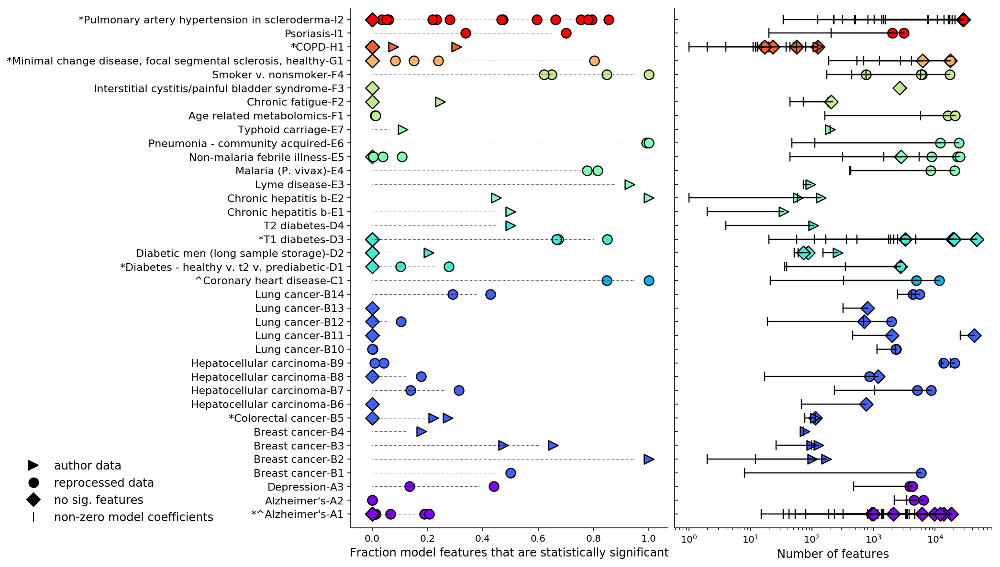

In [45]:
def get_biggest_study_auc(xs,ys):
    x_line, y_line = [], []
    best_x_for_y = {i:0 for i in set(ys)}
    for x_, y_ in zip(xs,ys):
        if x_ > best_x_for_y[y_]:
            best_x_for_y[y_] = x_
    for k,v in sorted(best_x_for_y.items()):
        x_line.append(v)
        y_line.append(k)
    return x_line, y_line

# o_v_o = ['MTBLS352','MTBLS358','ST000045', 'ST000046', 'ST000284', 'ST000329', 'ST000763']
# not_combined = ['Feng', 'ST000046']
# study_spec = {study:'' for study in list(summary_w_metadata.study.unique())}
# for study in o_v_o:
#     study_spec[study] += '*'
# for study in not_combined:
#     study_spec[study] += '^'

fig = plt.figure(figsize=(12,10))
gs = gridspec.GridSpec(1, 2,wspace=0.02, width_ratios=[1, 1]) 
ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
# facecolor = [cmap(f) if f != None else 'none' for f in facecolors]
marker = ['o' if f != None else '>' for f in facecolors]
facecolor = [cmap(f) for f in colors]

# # plot the model data:
# for x_,y_,f_ in zip(model_data,y,facecolor): 
#     if x_ != 0:
#         ax.scatter(x_, y_, marker='s', s=100, alpha=1, facecolors=f_, edgecolor='k', linewidth=1.2)
    
# # plot the sig feat data:
# for x_,y_,f_ in zip(feat_data,y,facecolor): 
#     if x_ != 0:
#         ax.scatter(x_, y_, marker='d', s=100, alpha=1, facecolors=f_, edgecolor='k', linewidth=1.2)
    
# plot the overlap data:
for x_,y_, fd, f_,m_ in zip(shared_data,y,feat_data,facecolor,marker): 
    if fd == 0:
         m_ = 'D'
    ax.scatter(x_, y_, marker=m_, s=100, alpha=1, facecolors=f_, edgecolor='k', linewidth=1.2)

# loc = 1.1
# current_y = 0
# for sig_num, y_ in zip(feat_data, y):
#     if y_ != current_y:
#         current_y = y_
#         loc = 1.1
#         ax.text(loc,y_,sig_num)
#     else:
#         loc += 0.1
#         ax.text(loc,y_,sig_num)

labels = ["*^Alzheimer's", "Alzheimer's", '^Depression', 'Breast cancer', 'Breast cancer', 'Breast cancer', 
          'Breast cancer', '*Colorectal cancer', 'Hepatocellular carcinoma', 'Hepatocellular carcinoma', 
          'Hepatocellular carcinoma', 'Hepatocellular carcinoma', 'Lung cancer', 'Lung cancer', 'Lung cancer', 
          'Lung cancer', 'Lung cancer', '^Coronary heart disease', '*Diabetes - healthy v. t2 v. prediabetic',
          'Diabetic men (long sample storage)', '*T1 diabetes', 'T2 diabetes', 'Chronic hepatitis b', 
          'Chronic hepatitis b', 'Lyme disease', 'Malaria (P. vivax)', 'Non-malaria febrile illness',
          'Pneumonia - community acquired', 'Typhoid carriage', 'Age related metabolomics', 'Chronic fatigue',
          'Interstitial cystitis/painful bladder syndrome', 'Smoker v. nonsmoker', 
          '*Minimal change disease, focal segmental sclerosis, healthy', '*COPD', 'Psoriasis',
          '*Pulmonary artery hypertension in scleroderma']

# need to get for each study the farthest point so you draw one dashed line:
line_x,line_y = get_biggest_study_auc(shared_data,y)
for x_, y_ in zip(line_x, line_y):
    if x_ <= 0.05:
        continue
    else:
        ax.plot([0,x_-0.05],[y_,y_], 'k:', linewidth=0.5)
ax.yaxis.set_ticks(np.arange(5, y[-1]+5, 5))
label_ID = ['A1','A2','A3','B1','B2','B3','B4','B5','B6','B7','B8','B9','B10','B11','B12','B13','B14','C1',
            'D1','D2','D3','D4','E1','E2','E3','E4','E5','E6','E7','F1','F2','F3','F4','G1','H1','I1','I2']
labels = [e1+'-'+e2 for e1, e2 in zip(labels,label_ID)]
ax.set_yticklabels(labels, fontname='Dejavu Sans', fontsize=11)
# ax.set_yticklabels([])
# ax.yaxis.set_ticks_position([])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.set_xlim([0,500])
ax.set_ylim([0,y[-1]+4])


for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(11)
    tick.label.set_fontproperties('Dejavu Sans')
ax.set_xlabel('Fraction model features that are statistically significant', fontname='Dejavu Sans', fontsize=12)

# make legend:
disease_to_color_legend = [(disease,cmap(color_fractions[disease_to_num[disease]])) for disease in disease_to_num]
legend_data = [['author data', 'k', 'k', '>'],
               ['reprocessed data', 'k', 'k', 'o'],
               ['no sig. features', 'k', 'k', 'D'],
               ['non-zero model coefficients', 'k', 'k', '|']]
patches_bar = []
for ele in legend_data:
    patches_bar.append(Line2D([0],[0], color='w', marker=ele[3],markerfacecolor=ele[1], markeredgecolor=ele[2], label=ele[0], markersize=10))
    

for mod_,tot_,y_, fd, f_,m_ in zip(total_model,total_feat,y,feat_data,facecolor,marker): 
    if fd == 0:
         m_ = 'D'
    ax2.scatter(tot_, y_, marker=m_, s=100, alpha=1, facecolors=f_, edgecolor='k', linewidth=1.2)
    if mod_ != 0:
        ax2.scatter(mod_, y_, marker='|', s=100, alpha=1, facecolors='k', edgecolor='k', linewidth=1.2)
        ax2.plot([mod_,tot_],[y_,y_], linewidth=1.2, c='k')
ax2.set_xscale("log")
ax2.yaxis.set_ticks(np.arange(5, y[-1]+5, 5))
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.set_yticklabels([])
ax2.set_ylim([0,y[-1]+4])
ax2.tick_params(axis='x', direction='out')
ax2.tick_params(axis='y', direction='in')
ax2.set_xlabel('Number of features', fontname='Dejavu Sans', fontsize=12)
  
font = font_manager.FontProperties(family='Dejavu Sans', style='normal', size=12)
lgd = ax.legend(handles=patches_bar, bbox_to_anchor=(-0.4, 0.15), frameon=False, prop=font)
plt.savefig('Fig4_a.svg', format='svg', dpi=1000, bbox_extra_artists=(lgd,), bbox_inches='tight')

### now looking at individual ds features like mz/rt/enrichment/p_values/model_coef

/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


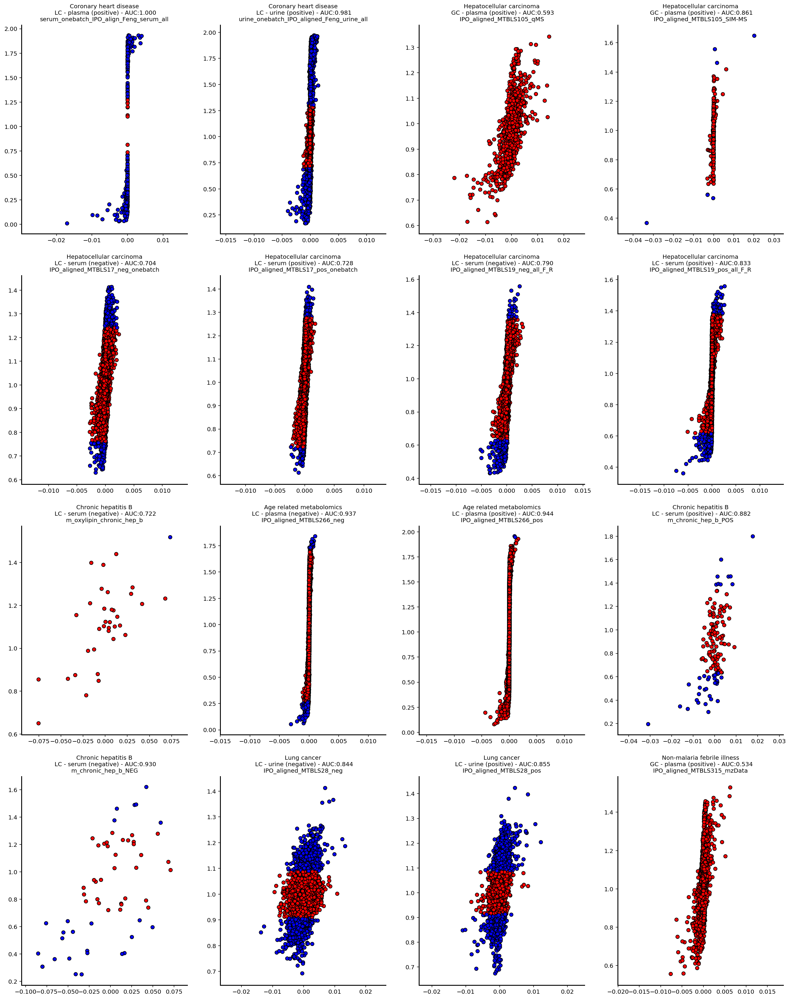

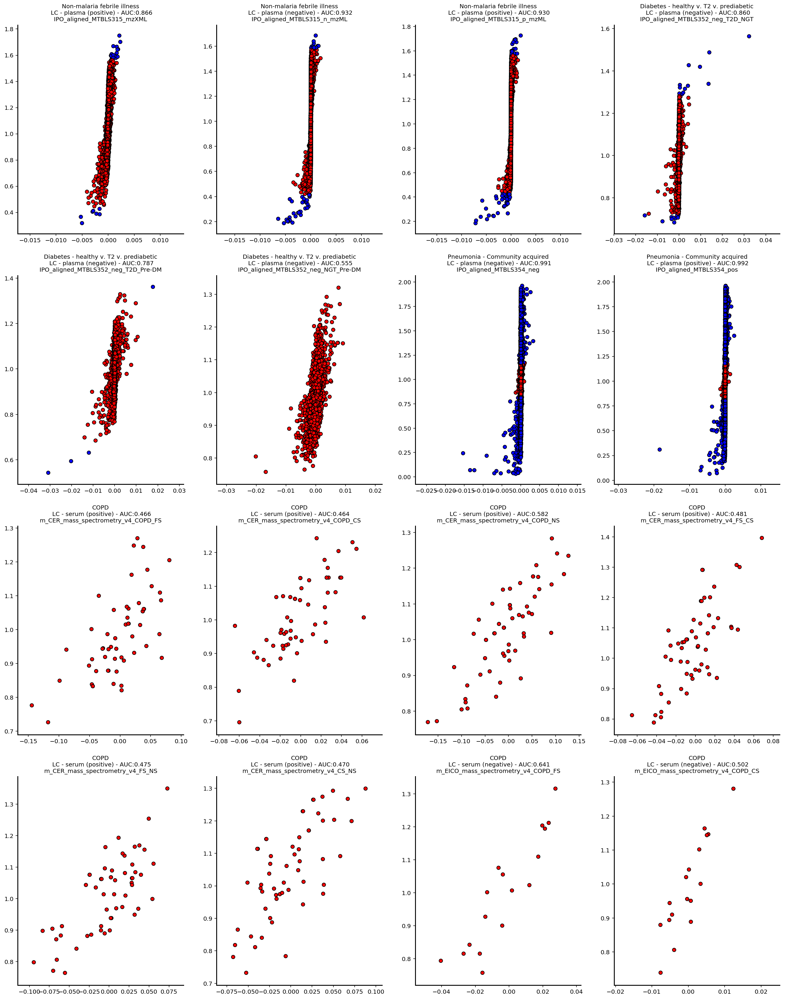

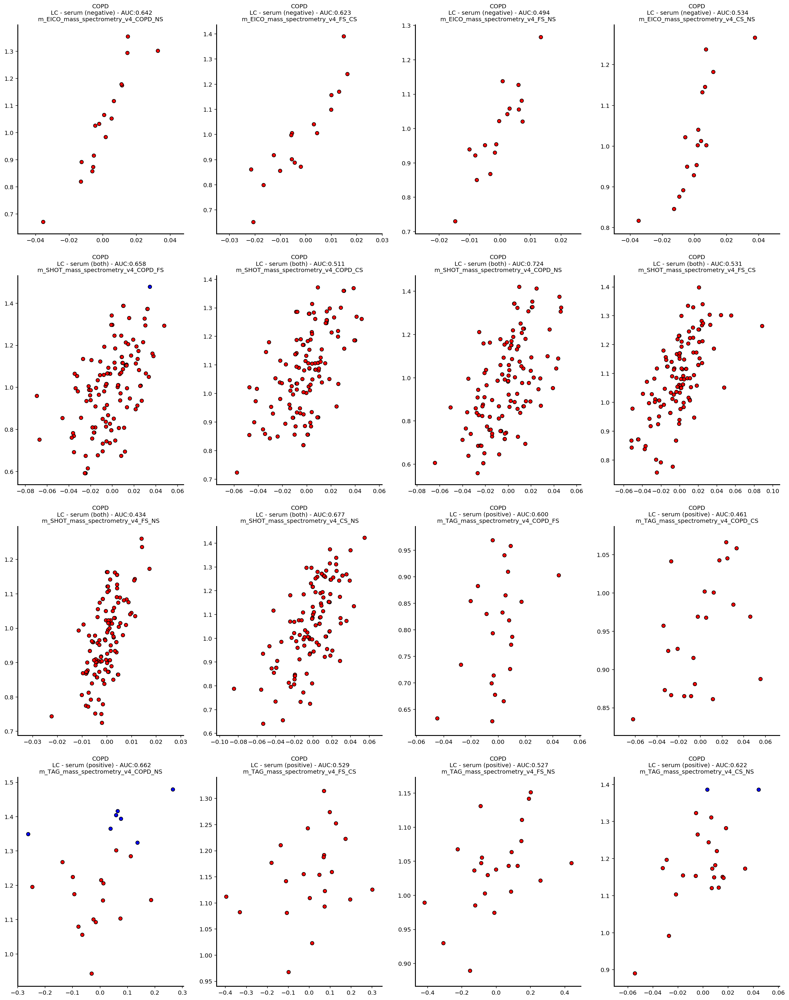

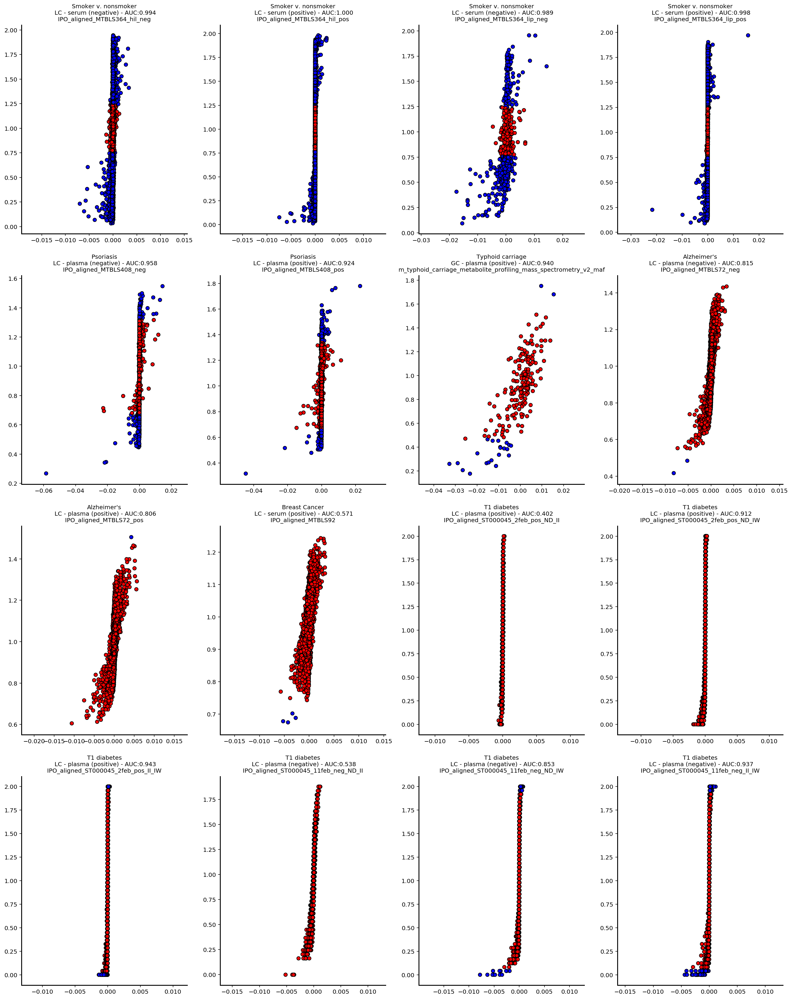

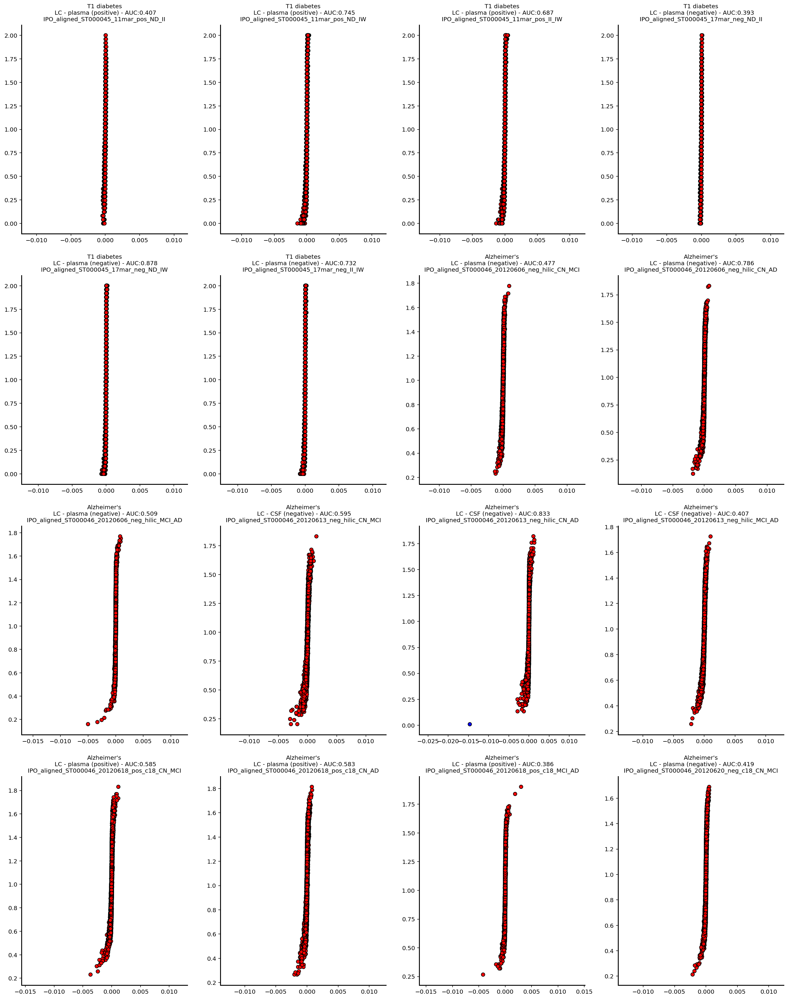

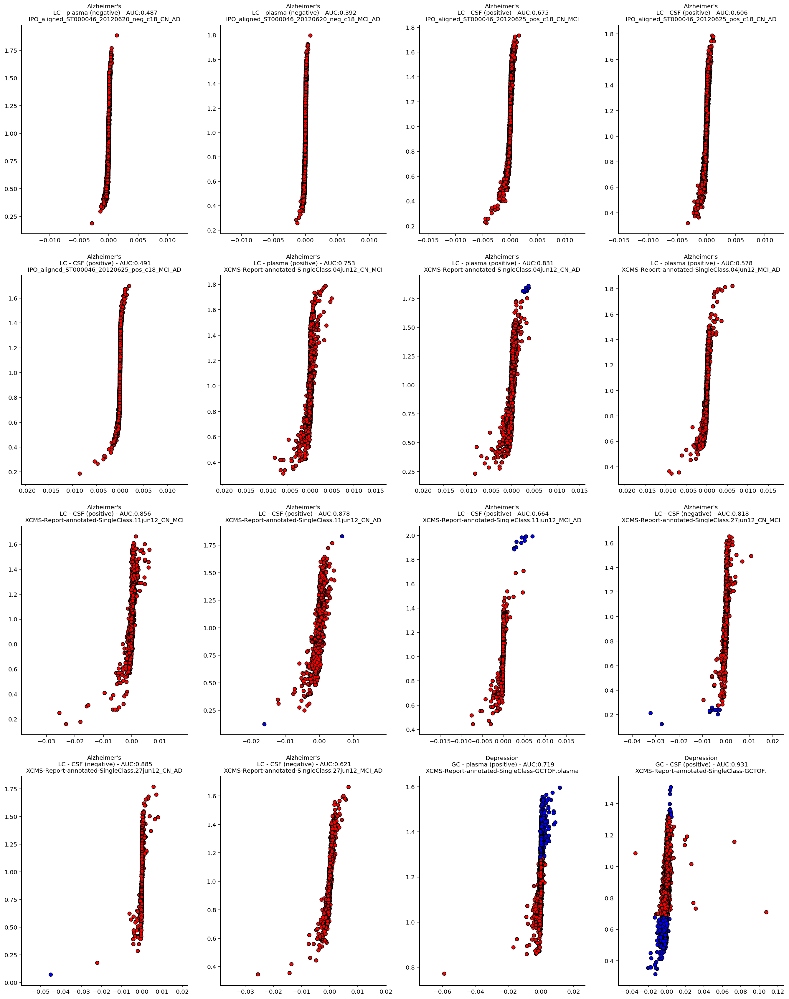

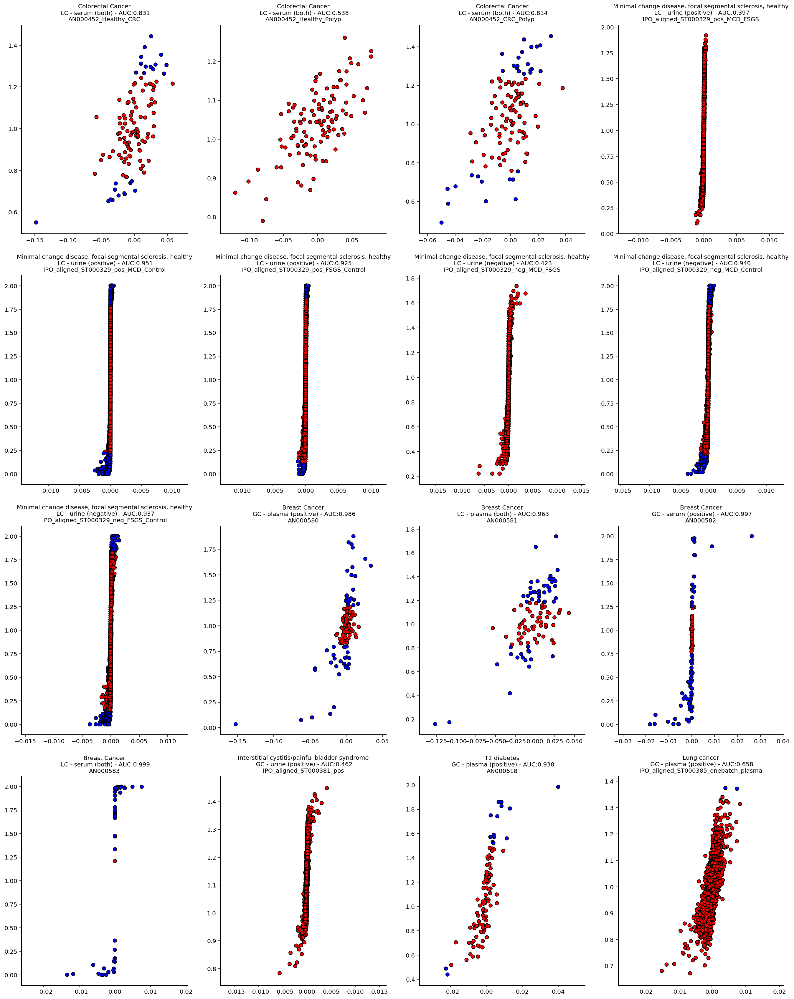

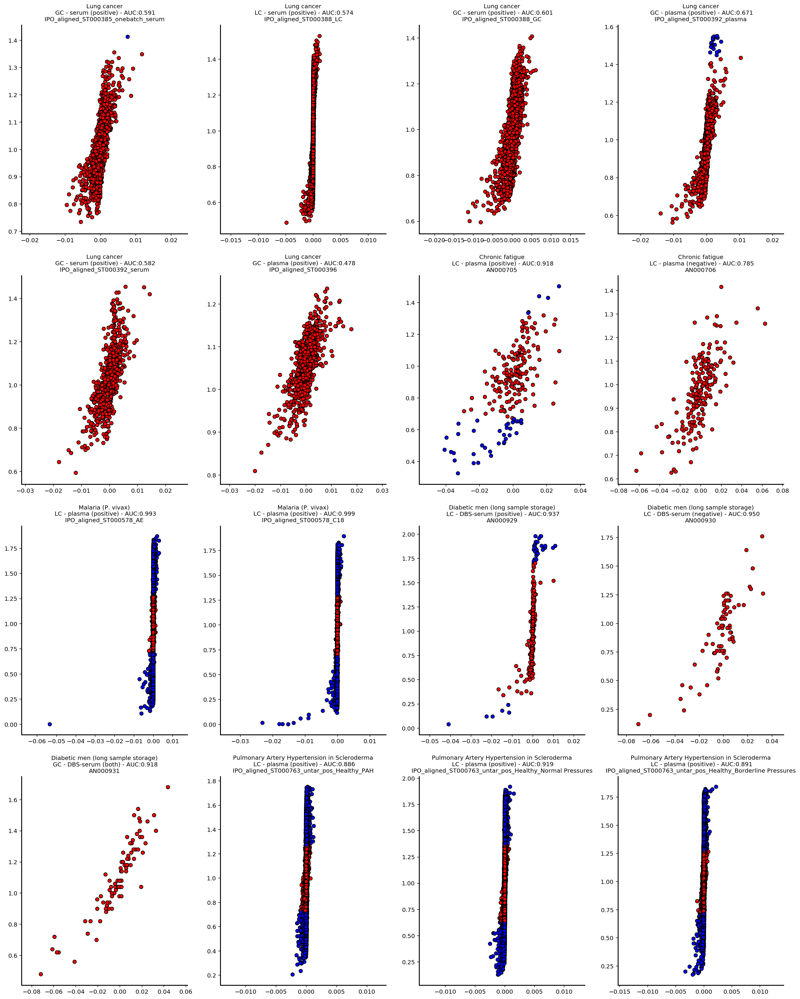

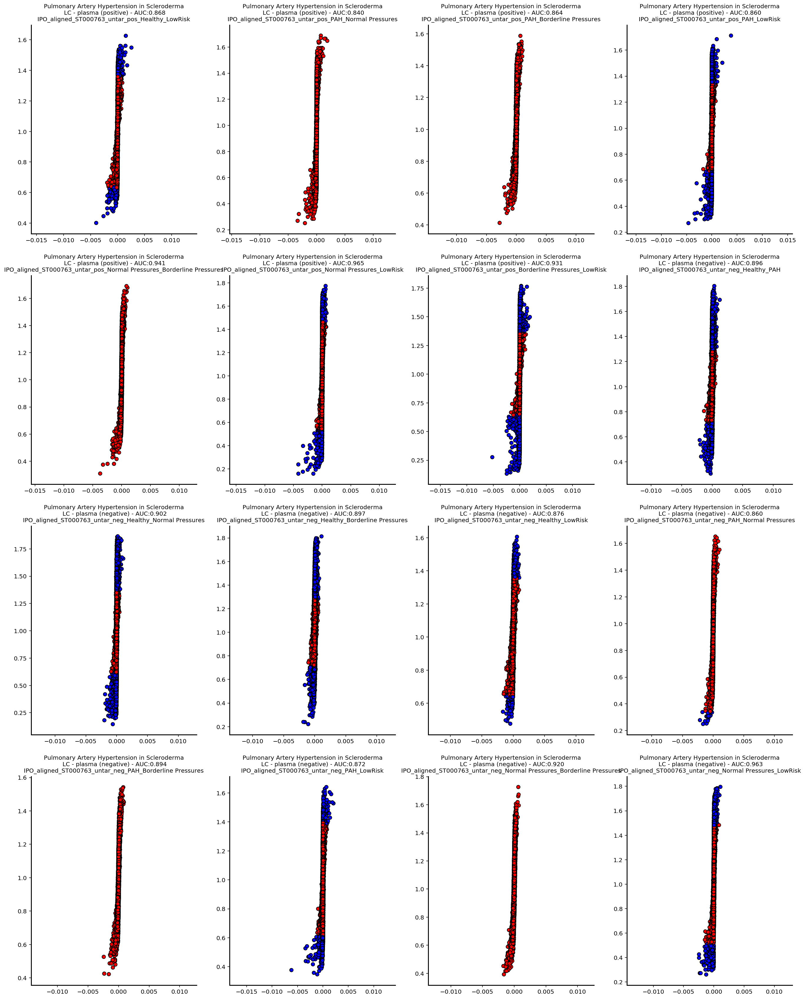

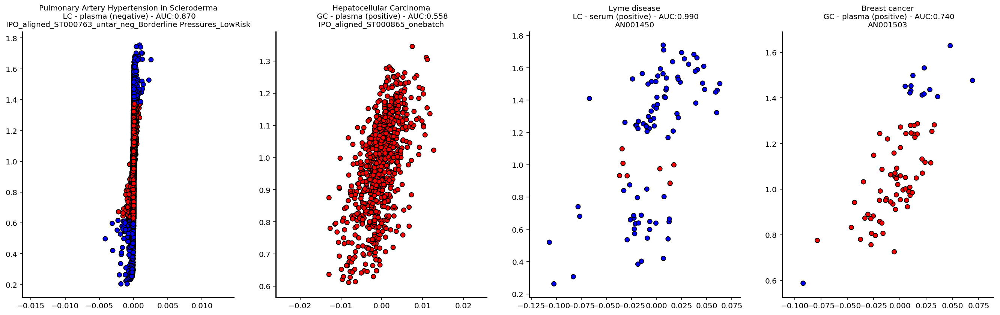

In [55]:
i = 0
plt_count = 0
for study in ds_to_study: 
    for sub_study in ds_to_study[study]:

        if i % 16 == 0:
            if i != 0:
                plt.tight_layout()
                plt.savefig('SI_Fig4_enrichment_model_coef_{}.png'.format(plt_count), format='png', dpi=100, bbox_inches='tight')
                plt.show()
                i=0
                plt_count += 1
            fig = plt.figure(figsize=(23.18,30))
            gs = gridspec.GridSpec(4, 4,wspace=0.2) 
        enrichment = list(sub_study['enrichment'])
#         pvalues = list(sub_study['pvalues'])
        pvalues = list(sub_study['indiv_split_p_vals'])
        if sub_study['data_set'] == 'AN001503' or sub_study['data_set'] == 'AN000930' or sub_study['data_set'] == 'AN000929' or sub_study['data_set'] == 'AN000618':
            sub_study['peaks'] = sub_study['peaks'].loc[:,~sub_study['peaks'].columns.duplicated()]
        try:
            mz = list(sub_study['peaks']['mz'])
            rt = list(sub_study['peaks']['rt'])
        except:
            continue
#         model_coefs = sub_study['clf'].coef_[0].tolist()
        model_coefs = sub_study['indiv_split_model_coefs']

        instrument = list(meta_data[meta_data.analysis == sub_study['data_set']].Instrument_category)[0]
        auc = sub_study['auc']
        stype = list(meta_data[meta_data.analysis == sub_study['data_set']].type)[0]
        mode = meta_data[meta_data.analysis == sub_study['data_set']]['mode'].values[0]
        sup_title = sub_study['disease']
        if sup_title in fixes:
            sup_title = fixes[sup_title]
        sup_title = sup_title[0].upper() + sup_title[1:]
        title = sup_title + '\n {} - {} ({}) - AUC:{:0.3f}'.format(instrument, stype, mode, auc) + '\n' + sub_study['data_set']

        model_coefs = np.asarray(model_coefs)
        enrichment = np.asarray(enrichment)
        pvalues = np.asarray(pvalues)
        errs = sub_study['combined_coefs_std'][model_coefs!=0]
        m_coef = model_coefs[model_coefs != 0]
        en = enrichment[model_coefs != 0]
        ps = pvalues[model_coefs !=0]
        col = ['b' if ele <= 0.05 else 'r' for ele in ps]
        
        ax = plt.subplot(gs[i])
        ax.scatter(m_coef, en, c=col, edgecolor='k')
#         ax.errorbar(m_coef, en, xerr=errs, fmt='none',ecolor='k', elinewidth=0.5)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        for tick in ax.get_yticklabels():
            tick.set_fontname("Dejavu Sans")
            tick.set_fontsize(10)
        for tick in ax.get_xticklabels():
            tick.set_fontname("Dejavu Sans")
            tick.set_fontsize(10)
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_linewidth(1.5)
        ax.set_title(title, fontname='Dejavu Sans', fontsize=10)
        i+=1
               
#         if make_mz_rt_plots:
#             for p,mod,en in zip(pvalues, model_coefs, enrichment):
#                 if p > 0.05 and mod == 0:
#                     colors.append('lightgrey')
#                     alphas.append(0.4)
#                     shapes.append('o')
#                     sizes.append(10)
#                     ecolors.append('')
#                 elif p <= 0.05 and mod == 0:
#                     if en > 1.0:
#                         colors.append('firebrick')
#                     else:
#                         colors.append('royalblue')
#                     alphas.append(0.7)
#                     shapes.append('^')
#                     sizes.append(-5*np.log(p))
#                     ecolors.append('k')
#                 elif p > 0.05 and mod != 0:
#                     if en > 1.0:
#                         colors.append('firebrick')
#                     else:
#                         colors.append('royalblue')
#                     alphas.append(0.7)
#                     shapes.append('s')
#                     sizes.append(20*(np.absolute(mod)+1))
#                     ecolors.append('k')
#                 elif p <= 0.05 and mod != 0:
#                     if en > 1.0:
#                         colors.append('firebrick')
#                     else:
#                         colors.append('royalblue')
#                     alphas.append(0.7)
#                     shapes.append('D')
#     #                 print(-5*np.log(p),-5*np.log(1/np.absolute(mod)))
#                     sizes.append(max(-5*np.log(p),5*np.log(1/np.absolute(mod))))
#                     ecolors.append('k')
#                 else:
#                     print(p,mod,en)
#             for rt,mz,c,e_c,sh,si,a in zip(rt, mz, colors, ecolors, shapes, sizes, alphas):
#                 plt.scatter(rt, mz, c=c, s=si, marker=sh, alpha=a, edgecolors=e_c)
#             print(sub_study['data_set'], sub_study['features'].shape, sub_study['pvalues'][sub_study['pvalues'] <= 0.05].shape)
#             plt.show()


In [17]:
removed_all_ds =  pd.read_csv('./paper_models_csvs_pkls/summary-sig_rem_True_rem_add_True_stat_sig_False_top_sig_False_0_30avg_auc_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo_YES_meta.csv')
removed_all_ds.set_index('analysis').loc[order].to_csv('./fig4_no_sig_add_or_iso_ordered_table.csv')
removed_stat_ds =  pd.read_csv('./paper_models_csvs_pkls/summary-sig_rem_True_stat_sig_False_top_sig_False_0_30avg_auc_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo_YES_meta.csv')
removed_stat_ds.set_index('analysis').loc[order].to_csv('./fig4_no_sig_ordered_table.csv')
individual_ds = pd.read_csv('./paper_models_csvs_pkls/summary-sig_rem_False_stat_sig_False_top_sig_False_0_30avg_auc_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo_YES_meta.csv')
individual_ds.set_index('analysis').loc[order].to_csv('./fig4_ordered_table.csv')

/home/ubuntu/data/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  


In [47]:
def df_naming_cleanup(df):
    fixes = {'autoimmune': 'rheumatologic', 'glomerular':'renal', 'metabolic':'endocrine',
             'neurological':'Neuro/Neuropsychiatric', 
             'minimal change disease, focal segmental sclerosis':'minimal change disease, focal segmental sclerosis, healthy',
             'Alzheimers':"Alzheimer's", 
             'Stability of dried blood samples - diabetic men':'diabetic men (long sample storage)',
             'lung cancer - non-small-cell lung cancer (adenocarcinoma, etc)': 'lung cancer', 
             'lung cancer - adenocarcinoma':'lung cancer',
             'scleroderma PAH': 'Pulmonary Artery Hypertension in Scleroderma',
             'Obesity - Non-diabetic and T2 diabetic': 't2 diabetes'
             }
    df = df.replace(fixes)
    return df

In [48]:
summary_w_metadata = pd.read_csv('./paper_models_csvs_pkls/summary-sig_rem_False_stat_sig_False_top_sig_False_0_30avg_auc_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo_YES_meta.csv').sort_values('study')
summary_w_metadata = summary_w_metadata.replace('ST000389', 'ST000388')
summary_w_metadata = summary_w_metadata.replace('ST000063', 'ST000062')
summary_w_metadata = df_naming_cleanup(summary_w_metadata)
summary_w_metadata = summary_w_metadata.set_index('analysis').loc[order]
summary_w_metadata

,Unnamed: 0,auc,auc_std,avg_stat_sig_per_model,case,control,disease,disease_type,features,label,model_nonzero_coef,number_labels,samples,significant,study,test_size,train_size,Instrument_category,Instument,column,mode,type,time_unit,delta_time
analysis,,,,,,,,,,,,,,,,,,,,,,,,
IPO_aligned_ST000046_20120606_neg_hilic_MCI_AD,72,0.495556,0.087423,0.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,18223,s2,5,2,30,0,ST000046,6,24,LC,Agilent 6220 TOF M,HILIC,negative,plasma,s,2.0
XCMS-Report-annotated-SingleClass.27jun12_CN_MCI,91,0.784444,0.069365,10.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,942,s21,5,2,30,10,ST000046,6,24,LC,Agilent 6220 TOF M,C18,negative,CSF,m,0.03333333333333299
XCMS-Report-annotated-SingleClass.27jun12_CN_AD,92,0.848889,0.062434,1.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,942,s22,3,2,30,1,ST000046,6,24,LC,Agilent 6220 TOF M,C18,negative,CSF,m,0.03333333333333299
XCMS-Report-annotated-SingleClass.11jun12_MCI_AD,90,0.690741,0.077729,10.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,1003,s20,4,2,30,10,ST000046,6,24,LC,Agilent 6220 TOF M,HILIC,positive,CSF,m,0.03333333333333299
IPO_aligned_ST000046_20120620_neg_c18_CN_MCI,79,0.370741,0.102820,0.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,13671,s9,10,2,30,0,ST000046,6,24,LC,Agilent 6220 TOF M,C18,negative,plasma,s,2.0
IPO_aligned_ST000046_20120618_pos_c18_CN_AD,77,0.579259,0.089292,0.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,12009,s7,2662,2,30,0,ST000046,6,24,LC,Agilent 6220 TOF M,C18,positive,plasma,s,2.0
IPO_aligned_ST000046_20120606_neg_hilic_CN_MCI,70,0.485556,0.098305,0.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,18223,s0,3620,2,30,0,ST000046,6,24,LC,Agilent 6220 TOF M,HILIC,negative,plasma,s,2.0
IPO_aligned_ST000046_20120606_neg_hilic_CN_AD,71,0.776296,0.073015,0.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,18223,s1,3488,2,30,0,ST000046,6,24,LC,Agilent 6220 TOF M,HILIC,negative,plasma,s,2.0
IPO_aligned_ST000046_20120613_neg_hilic_CN_MCI,73,0.621481,0.081343,0.0,15,15,Alzheimer's,Neuro/Neuropsychiatric,9685,s3,4666,2,30,0,ST000046,6,24,LC,Agilent 6220 TOF M,HILIC,negative,CSF,s,2.0


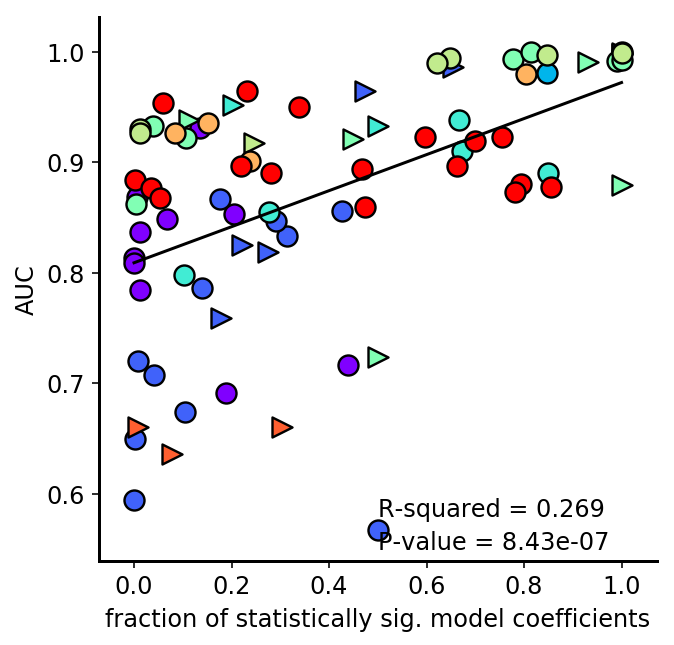

In [50]:
from scipy import stats

fig = plt.figure(figsize=(5,5))
ax = plt.subplot()
xs = []
ys = []
for x_,y_,f_,m_,sig in zip(shared_data,summary_w_metadata.auc,facecolor,marker, summary_w_metadata.significant): 
    if sig == 0:
        continue
    xs.append(x_)
    ys.append(y_)
    ax.scatter(x_, y_, marker=m_, s=100, alpha=1, facecolors=f_, edgecolor='k', linewidth=1.2)
ax.set_xlabel('fraction of statistically sig. model coefficients', fontsize=12,fontname='Dejavu Sans')
ax.set_ylabel('AUC', fontsize=12,fontname='Dejavu Sans')

gradient, intercept, r_value, p_value, std_err = stats.linregress(xs,ys)
x_model=np.linspace(0,1,50)
y_model=gradient*x_model+intercept
ax.plot(x_model,y_model,'k')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#     ax.tick_params(direction='in')
for tick in ax.get_yticklabels():
    tick.set_fontname("Dejavu Sans")
    tick.set_fontsize(12)
for tick in ax.get_xticklabels():
    tick.set_fontname("Dejavu Sans")
    tick.set_fontsize(12)
ax.spines['left'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)
plt.text(0.5,.55, 'P-value = {:0.2e}'.format(p_value), fontsize=12)
plt.text(0.5,0.58, 'R-squared = {:0.3f}'.format(r_value**2), fontsize=12)
plt.savefig('SI_AUC_v_fract_sig_model_feat_dswithoutsigfeat.svg', format='svg', dpi=1000, bbox_inches='tight')
plt.show()


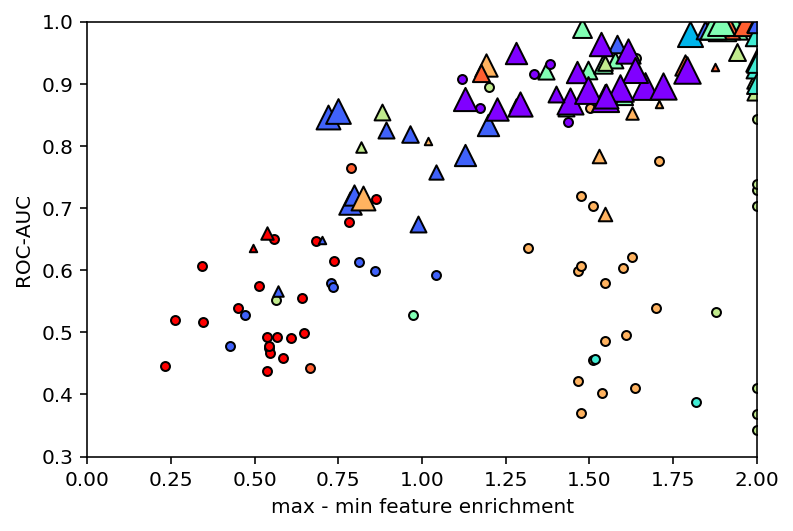

In [564]:
df_for_colors = pd.read_csv('./paper_models_csvs_pkls/summary-sig_rem_False_stat_sig_False_top_sig_False_0_30avg_auc_log_reg_YES_bn_NO_log_NO_standscal_YES_ovo_YES_meta.csv')
cmap = matplotlib.cm.get_cmap('rainbow')
disease_types_unique = df_for_colors.disease_type
disease_types_unique = sorted(list(set(disease_types_unique)))
disease_to_num = {disease:i for i,disease in enumerate(disease_types_unique)}
color_fractions = {i:int(i)/(len(disease_types_unique)-1) for i in range(len(disease_types_unique))}

x = []
y = []
s = []
m = []
c = []

for study in ds_to_study:
    for sub_study in ds_to_study[study]:        
        delta = sub_study['enrichment'].max()- sub_study['enrichment'].min()
        if sub_study['significant'] == 0:
            s.append(20)
            m.append('o')
        else:
            s.append(20*np.log(sub_study['significant']))
            m.append('^')
            
        d_type = df_for_colors[df_for_colors.analysis == sub_study['data_set']]['disease_type'].tolist()[0]
        c.append(d_type)
        auc = sub_study['auc']
        x.append(delta)
        y.append(auc)
    
#### get colors from new sorting
c = [cmap(color_fractions[disease_to_num[ele]]) for ele in c]

for x_, y_, s_, m_,c_ in zip(x,y,s,m,c):
    plt.scatter(x_,y_, s=s_, marker=m_, c=c_, edgecolor='k')
plt.xlabel('max - min feature enrichment')
plt.ylabel('ROC-AUC')
plt.xlim([0,2])
plt.ylim([0.3,1])
plt.show()
        